<a href="https://colab.research.google.com/github/yangyuwang/DL_final_project/blob/main/wangyd_coding_presentation_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Data Preprocessing

In [ ]:
import pandas as pd

file_id = '1Wa_MueOpfdXZveRS5J-eMLyaBQ-SeFtN'
uuid = '6139ffcf-19c1-46b4-b013-a33b11655f4d'
at = 'AIrpjvPTjK6nk2lXSIJKc8rBEEqH:1739041451599'

download_url = f'https://drive.usercontent.google.com/download?id={file_id}&export=download&authuser=0&confirm=t&uuid={uuid}&at={at}'

df = pd.read_csv(download_url)

df.head()

<ipython-input-1-67d5d9e385a8>:9: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(download_url)


,Artist_name,Artwork.Name,Year,Link,url,Create.Date,Create.Location,Date,image_url,Style,...,Wikipedia,Painting.School,Official.site,Friends.and.Co.workers,Family.and.Relatives,Pupils,Teachers,Art.institution,Artwork_ID,Style_Category
0,3d,No Great Crime,1983,https://www.wikiart.org/en/3d/no-great-crime-1983,https://www.wikiart.org/en/3d/no-great-crime-1983,1983.0,NaN,1983,https://uploads2.wikiart.org/images/3d/no-grea...,Street art,...,https://en.wikipedia.org/wiki/Robert_Del_Naja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Street & Urban Art
1,3d,3D,1984,https://www.wikiart.org/en/3d/3d-1984,https://www.wikiart.org/en/3d/3d-1984,1984.0,NaN,1984,https://uploads7.wikiart.org/images/3d/3d-1984...,Street art,...,https://en.wikipedia.org/wiki/Robert_Del_Naja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,Street & Urban Art
2,3d,Wild Bunch,1984,https://www.wikiart.org/en/3d/wild-bunch-1984,https://www.wikiart.org/en/3d/wild-bunch-1984,1984.0,NaN,1984,https://uploads6.wikiart.org/images/3d/wild-bu...,Street art,...,https://en.wikipedia.org/wiki/Robert_Del_Naja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,Street & Urban Art
3,3d,Serious Art,1986,https://www.wikiart.org/en/3d/serious-art-1986,https://www.wikiart.org/en/3d/serious-art-1986,1986.0,NaN,1986,https://uploads8.wikiart.org/images/3d/serious...,Street art,...,https://en.wikipedia.org/wiki/Robert_Del_Naja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,Street & Urban Art
4,3d,"Robert De Niro, Taxi Driver",1988,https://www.wikiart.org/en/3d/robert-de-niro-t...,https://www.wikiart.org/en/3d/robert-de-niro-t...,1988.0,NaN,1988,https://uploads5.wikiart.org/images/3d/robert-...,Street art,...,https://en.wikipedia.org/wiki/Robert_Del_Naja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,Street & Urban Art


In [ ]:
!kaggle datasets download -d yangyuwang/wikiart-images -p /content/artworks/

Dataset URL: https://www.kaggle.com/datasets/yangyuwang/wikiart-images
License(s): MIT
100% 29.6G/29.7G [04:20<00:00, 151MB/s]
100% 29.7G/29.7G [04:20<00:00, 122MB/s]


In [ ]:
! unzip /content/artworks/wikiart-images.zip -d /content/artworks/

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: /content/artworks/artwork_picture/00193/00193623.jpg  
  inflating: /content/artworks/artwork_picture/00193/00193623.json  
  inflating: /content/artworks/artwork_picture/00193/00193623.txt  
  inflating: /content/artworks/artwork_picture/00193/00193624.jpg  
  inflating: /content/artworks/artwork_picture/00193/00193624.json  
  inflating: /content/artworks/artwork_picture/00193/00193624.txt  
  inflating: /content/artworks/artwork_picture/00193/00193625.jpg  
  inflating: /content/artworks/artwork_picture/00193/00193625.json  
  inflating: /content/artworks/artwork_picture/00193/00193625.txt  
  inflating: /content/artworks/artwork_picture/00193/00193626.jpg  
  inflating: /content/artworks/artwork_picture/00193/00193626.json  
  inflating: /content/artworks/artwork_picture/00193/00193626.txt  
  inflating: /content/artworks/artwork_picture/00193/00193627.jpg  
  inflating: /content/artworks/artwork_picture/00193/00193627.json  
  inflating: /co

In [ ]:
import os
import json
from PIL import Image
from tqdm import tqdm
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt

In [ ]:
ARTWORK_DIR = '/content/artworks/artwork_picture'
artwork_df = df.dropna(subset=['image_n', 'Artwork_ID'])
artwork_df['year'] = pd.to_numeric(artwork_df['Year'], errors='coerce')

MIN_SAMPLES = 100  # threshold
style_counts = artwork_df['Style_Category'].value_counts()
valid_styles = style_counts[style_counts >= MIN_SAMPLES].index.tolist()
artwork_df = artwork_df[artwork_df['Style_Category'].isin(valid_styles)].reset_index(drop=True)

artwork_df.shape

(151724, 41)

In [ ]:
class ArtworkDataset(Dataset):
    """
    A PyTorch Dataset for loading artwork images from the local directory.
    The image file name is constructed from the 'image_n' column (zero-padded to 8 digits).
    """
    def __init__(self, dataframe, image_dir, transform=None):
        """
        Args:
            dataframe (pd.DataFrame): DataFrame containing artwork metadata.
            image_dir (str): Directory where the image (and JSON) files are stored.
            transform (callable, optional): Transform to be applied on a PIL image.
        """
        self.data = dataframe
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        image_n = row['image_n']
        try:
            image_filename = f"{int(image_n):08d}.jpg"
        except:
            image_filename = f"{str(image_n).zfill(8)}.jpg"

        subdirectory = f"{int(image_n) // 1000:05d}"
        image_path = os.path.join(self.image_dir, subdirectory, image_filename)

        # Load the image from disk.
        try:
            image = Image.open(image_path).convert('RGB')
        except Exception as e:
            image = Image.new('RGB', (64, 64), color=(0, 0, 0))  # Black blank image

        # Apply the transform
        if self.transform:
            image = self.transform(image)

        image_array = np.array(image)

        artwork_id = row['Artwork_ID']
        return image_array, image, artwork_id

In [ ]:
artwork_dataset = ArtworkDataset(artwork_df, image_dir=ARTWORK_DIR)

### Style Transfer

In [ ]:
artwork_df[artwork_df["Artwork.Name"] == "Weeping Woman"].index

Index([41908, 98829, 98830, 110316], dtype='int64')

In [ ]:
artwork_df[artwork_df["Artwork.Name"] == "Impression, sunrise"].index

Index([27824], dtype='int64')

In [ ]:
starry_night = artwork_dataset[144775][1]

In [ ]:
weeping_woman = artwork_dataset[110316][1]

In [ ]:
sunrise_impre = artwork_dataset[27824][1]

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19

In [ ]:
# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = sunrise_impre.size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

In [ ]:
def preprocess_image(image):
    # Util function to open, resize and format pictures into appropriate tensors
    img = image.resize((img_ncols, img_nrows))  # Resize the image
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [ ]:
# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [ ]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [ ]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [ ]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(sunrise_impre)
style_reference_image = preprocess_image(weeping_woman)
combination_image = tf.Variable(preprocess_image(sunrise_impre))

result_prefix = "sunrise_by_weeping_woman"

iterations = 4000
for i in tqdm(range(1, iterations + 1)):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.preprocessing.image.save_img(fname, img)

  2%|▎         | 100/4000 [00:21<28:35,  2.27it/s]

Iteration 100: loss=19182.57


  5%|▌         | 200/4000 [00:43<26:46,  2.37it/s]

Iteration 200: loss=14167.04


  8%|▊         | 300/4000 [01:04<25:33,  2.41it/s]

Iteration 300: loss=12248.32


 10%|█         | 400/4000 [01:26<25:03,  2.39it/s]

Iteration 400: loss=11176.28


 12%|█▎        | 500/4000 [01:47<24:40,  2.36it/s]

Iteration 500: loss=10480.85


 15%|█▌        | 600/4000 [02:08<23:46,  2.38it/s]

Iteration 600: loss=9983.44


 18%|█▊        | 700/4000 [02:30<23:05,  2.38it/s]

Iteration 700: loss=9603.85


 20%|██        | 800/4000 [02:51<22:18,  2.39it/s]

Iteration 800: loss=9302.55


 22%|██▎       | 900/4000 [03:12<21:39,  2.39it/s]

Iteration 900: loss=9057.70


 25%|██▌       | 1000/4000 [03:33<20:53,  2.39it/s]

Iteration 1000: loss=8854.11


 28%|██▊       | 1100/4000 [03:55<20:12,  2.39it/s]

Iteration 1100: loss=8681.58


 30%|███       | 1200/4000 [04:16<19:35,  2.38it/s]

Iteration 1200: loss=8532.79


 32%|███▎      | 1300/4000 [04:37<18:50,  2.39it/s]

Iteration 1300: loss=8403.55


 35%|███▌      | 1400/4000 [04:59<18:13,  2.38it/s]

Iteration 1400: loss=8290.48


 38%|███▊      | 1500/4000 [05:20<17:25,  2.39it/s]

Iteration 1500: loss=8190.73


 40%|████      | 1600/4000 [05:41<16:47,  2.38it/s]

Iteration 1600: loss=8102.08


 42%|████▎     | 1700/4000 [06:03<16:01,  2.39it/s]

Iteration 1700: loss=8022.37


 45%|████▌     | 1800/4000 [06:24<15:21,  2.39it/s]

Iteration 1800: loss=7950.13


 48%|████▊     | 1900/4000 [06:45<14:36,  2.39it/s]

Iteration 1900: loss=7884.67


 50%|█████     | 2000/4000 [07:06<13:54,  2.40it/s]

Iteration 2000: loss=7825.28


 52%|█████▎    | 2100/4000 [07:28<13:15,  2.39it/s]

Iteration 2100: loss=7771.07


 55%|█████▌    | 2200/4000 [07:49<12:30,  2.40it/s]

Iteration 2200: loss=7721.24


 57%|█████▊    | 2300/4000 [08:10<11:52,  2.39it/s]

Iteration 2300: loss=7675.27


 60%|██████    | 2400/4000 [08:31<11:09,  2.39it/s]

Iteration 2400: loss=7632.94


 62%|██████▎   | 2500/4000 [08:53<10:26,  2.39it/s]

Iteration 2500: loss=7593.78


 65%|██████▌   | 2600/4000 [09:14<09:43,  2.40it/s]

Iteration 2600: loss=7557.36


 68%|██████▊   | 2700/4000 [09:35<09:01,  2.40it/s]

Iteration 2700: loss=7523.45


 70%|███████   | 2800/4000 [09:56<08:20,  2.40it/s]

Iteration 2800: loss=7491.89


 72%|███████▎  | 2900/4000 [10:18<07:40,  2.39it/s]

Iteration 2900: loss=7462.52


 75%|███████▌  | 3000/4000 [10:39<06:58,  2.39it/s]

Iteration 3000: loss=7435.17


 78%|███████▊  | 3100/4000 [11:00<06:16,  2.39it/s]

Iteration 3100: loss=7409.58


 80%|████████  | 3200/4000 [11:22<05:36,  2.38it/s]

Iteration 3200: loss=7385.67


 82%|████████▎ | 3300/4000 [11:43<04:54,  2.38it/s]

Iteration 3300: loss=7363.27


 85%|████████▌ | 3400/4000 [12:04<04:11,  2.38it/s]

Iteration 3400: loss=7342.23


 88%|████████▊ | 3500/4000 [12:25<03:29,  2.39it/s]

Iteration 3500: loss=7322.55


 90%|█████████ | 3600/4000 [12:47<02:47,  2.39it/s]

Iteration 3600: loss=7303.99


 92%|█████████▎| 3700/4000 [13:08<02:05,  2.39it/s]

Iteration 3700: loss=7286.47


 95%|█████████▌| 3800/4000 [13:29<01:23,  2.39it/s]

Iteration 3800: loss=7269.90


 98%|█████████▊| 3900/4000 [13:51<00:41,  2.40it/s]

Iteration 3900: loss=7254.29


100%|██████████| 4000/4000 [14:12<00:00,  4.69it/s]

Iteration 4000: loss=7239.53


In [ ]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(sunrise_impre)
style_reference_image = preprocess_image(starry_night)
combination_image = tf.Variable(preprocess_image(sunrise_impre))

result_prefix = "sunrise_by_starry_night"

iterations = 4000
for i in tqdm(range(1, iterations + 1)):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = result_prefix + "_at_iteration_%d.png" % i
        keras.preprocessing.image.save_img(fname, img)

  2%|▎         | 100/4000 [00:21<28:36,  2.27it/s]

Iteration 100: loss=1957.04


  5%|▌         | 200/4000 [00:43<27:14,  2.32it/s]

Iteration 200: loss=1581.43


  8%|▊         | 300/4000 [01:04<25:58,  2.37it/s]

Iteration 300: loss=1414.96


 10%|█         | 400/4000 [01:26<25:15,  2.38it/s]

Iteration 400: loss=1311.24


 12%|█▎        | 500/4000 [01:47<24:44,  2.36it/s]

Iteration 500: loss=1238.00


 15%|█▌        | 600/4000 [02:08<24:07,  2.35it/s]

Iteration 600: loss=1182.59


 18%|█▊        | 700/4000 [02:30<23:17,  2.36it/s]

Iteration 700: loss=1138.45


 20%|██        | 800/4000 [02:51<22:30,  2.37it/s]

Iteration 800: loss=1102.06


 22%|██▎       | 900/4000 [03:12<21:44,  2.38it/s]

Iteration 900: loss=1071.43


 25%|██▌       | 1000/4000 [03:34<21:07,  2.37it/s]

Iteration 1000: loss=1045.10


 28%|██▊       | 1100/4000 [03:55<20:29,  2.36it/s]

Iteration 1100: loss=1022.12


 30%|███       | 1200/4000 [04:17<19:49,  2.35it/s]

Iteration 1200: loss=1001.91


 32%|███▎      | 1300/4000 [04:38<19:04,  2.36it/s]

Iteration 1300: loss=983.91


 35%|███▌      | 1400/4000 [04:59<18:18,  2.37it/s]

Iteration 1400: loss=967.84


 38%|███▊      | 1500/4000 [05:21<17:41,  2.36it/s]

Iteration 1500: loss=953.41


 40%|████      | 1600/4000 [05:42<16:58,  2.36it/s]

Iteration 1600: loss=940.33


 42%|████▎     | 1700/4000 [06:03<16:16,  2.36it/s]

Iteration 1700: loss=928.41


 45%|████▌     | 1800/4000 [06:25<15:34,  2.35it/s]

Iteration 1800: loss=917.52


 48%|████▊     | 1900/4000 [06:46<14:53,  2.35it/s]

Iteration 1900: loss=907.53


 50%|█████     | 2000/4000 [07:08<14:07,  2.36it/s]

Iteration 2000: loss=898.33


 52%|█████▎    | 2100/4000 [07:29<13:21,  2.37it/s]

Iteration 2100: loss=889.84


 55%|█████▌    | 2200/4000 [07:50<12:40,  2.37it/s]

Iteration 2200: loss=881.97


 57%|█████▊    | 2300/4000 [08:12<11:55,  2.37it/s]

Iteration 2300: loss=874.67


 60%|██████    | 2400/4000 [08:33<11:15,  2.37it/s]

Iteration 2400: loss=867.88


 62%|██████▎   | 2500/4000 [08:54<10:31,  2.38it/s]

Iteration 2500: loss=861.54


 65%|██████▌   | 2600/4000 [09:16<09:52,  2.36it/s]

Iteration 2600: loss=855.63


 68%|██████▊   | 2700/4000 [09:37<09:11,  2.36it/s]

Iteration 2700: loss=850.10


 70%|███████   | 2800/4000 [09:58<08:29,  2.36it/s]

Iteration 2800: loss=844.93


 72%|███████▎  | 2900/4000 [10:20<07:47,  2.35it/s]

Iteration 2900: loss=840.08


 75%|███████▌  | 3000/4000 [10:41<07:08,  2.33it/s]

Iteration 3000: loss=835.53


 78%|███████▊  | 3100/4000 [11:03<06:21,  2.36it/s]

Iteration 3100: loss=831.25


 80%|████████  | 3200/4000 [11:24<05:39,  2.35it/s]

Iteration 3200: loss=827.24


 82%|████████▎ | 3300/4000 [11:45<04:57,  2.35it/s]

Iteration 3300: loss=823.45


 85%|████████▌ | 3400/4000 [12:07<04:14,  2.36it/s]

Iteration 3400: loss=819.89


 88%|████████▊ | 3500/4000 [12:28<03:31,  2.36it/s]

Iteration 3500: loss=816.53


 90%|█████████ | 3600/4000 [12:50<02:49,  2.36it/s]

Iteration 3600: loss=813.35


 92%|█████████▎| 3700/4000 [13:11<02:06,  2.36it/s]

Iteration 3700: loss=810.35


 95%|█████████▌| 3800/4000 [13:32<01:24,  2.36it/s]

Iteration 3800: loss=807.51


 98%|█████████▊| 3900/4000 [13:54<00:42,  2.37it/s]

Iteration 3900: loss=804.82


100%|██████████| 4000/4000 [14:15<00:00,  4.68it/s]

Iteration 4000: loss=802.27


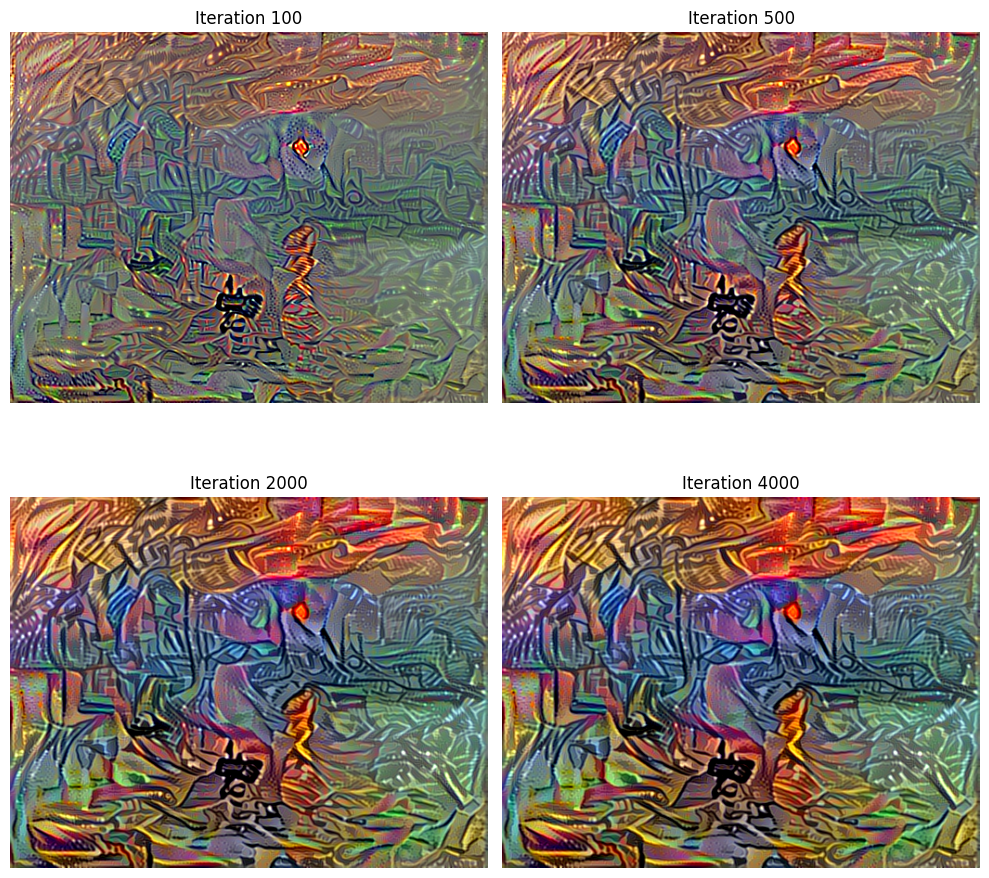

In [ ]:
from PIL import Image
# Directory where images are saved
result_prefix = "sunrise_by_weeping_woman"
rangelist = [100, 500, 2000, 4000]

# Collect all image file names
image_files = [
    f"{result_prefix}_at_iteration_{i}.png" for i in rangelist
]

# Display all saved images in a row
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Load and display images
for ax, img_path in zip(axes, image_files):
    if os.path.exists(img_path):
        ax.imshow(Image.open(img_path))
        ax.set_title(f"Iteration {img_path.split('_')[-1].split('.')[0]}")
    ax.axis("off")  # Hide axes

plt.tight_layout()
plt.show()

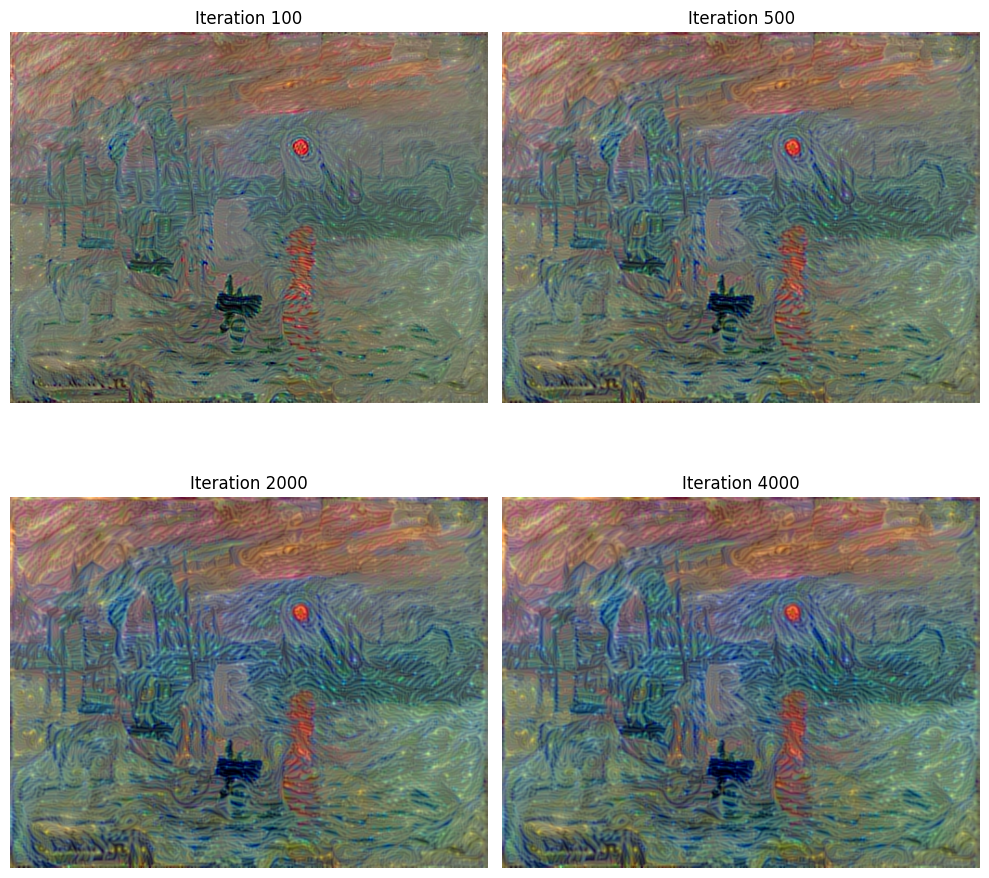

In [ ]:
# Directory where images are saved
result_prefix = "sunrise_by_starry_night"
rangelist = [100, 500, 2000, 4000]

# Collect all image file names
image_files = [
    f"{result_prefix}_at_iteration_{i}.png" for i in rangelist
]

# Display all saved images in a row
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Load and display images
for ax, img_path in zip(axes, image_files):
    if os.path.exists(img_path):
        ax.imshow(Image.open(img_path))
        ax.set_title(f"Iteration {img_path.split('_')[-1].split('.')[0]}")
    ax.axis("off")  # Hide axes

plt.tight_layout()
plt.show()

### ArtGAN

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import torchvision.transforms as transforms

In [ ]:
focused_artists = {"claude-monet": 0,
                   "vincent-van-gogh": 1,
                   "pierre-auguste-renoir": 2,
                   "camille-pissarro": 3,
                   "charles-laval": 4,
                   "paul-gauguin": 5}

network_dict = {"claude-monet": 0, "vincent-van-gogh": 1}


artwork_df_focused_artist = artwork_df[artwork_df["Artist_name"].isin(focused_artists.keys())]
artwork_df_focused_artist = artwork_df_focused_artist.reset_index(drop = True)
transform = transforms.Compose([
        transforms.Resize((64, 64))
    ])
artwork_dataset_focused_artist = ArtworkDataset(artwork_df_focused_artist, image_dir=ARTWORK_DIR, transform=transform)

In [ ]:
len(artwork_df_focused_artist)

6506

#### GAN

In [ ]:
import tensorflow as tf
import torch
from torch.utils.data import DataLoader
import numpy as np
from torchvision import transforms

def pytorch_to_tf_dataset(artwork_dataset, batch_size=32, shuffle=True):
    """
    Converts an ArtworkDataset instance (PyTorch Dataset) to a TensorFlow tf.data.Dataset.

    Args:
        artwork_dataset (Dataset): Instance of ArtworkDataset.
        batch_size (int): Batch size for the TensorFlow dataset.
        shuffle (bool): Whether to shuffle the dataset.

    Returns:
        tf.data.Dataset: TensorFlow dataset with only images.
    """

    # Define transform to convert PIL to Tensor
    transform = transforms.ToTensor()  # Converts (H, W, C) → (C, H, W) & normalizes to [0,1]

    def collate_fn(batch):
        """Custom function to convert PIL images into tensors before batching"""
        images, _, _ = zip(*batch)  # Unpack batch (ignore labels and indices)

        # Convert PIL images to tensors
        images = [transform(img) if isinstance(img, torch.Tensor) else transform(img) for img in images]

        # Stack tensors into a batch
        image_tensors = torch.stack(images)

        return image_tensors  # ✅ Return only images

    # PyTorch DataLoader for batching & shuffling with custom collate function
    dataloader = DataLoader(artwork_dataset, batch_size=batch_size, shuffle=shuffle, collate_fn=collate_fn)

    def generator():
        """Generator function for TensorFlow Dataset (returns only images)"""
        for image_tensors in dataloader:
            # Convert (C, H, W) → (H, W, C) and normalize
            image_arrays = image_tensors.permute(0, 2, 3, 1).numpy().astype(np.float32)
            yield image_arrays  # ✅ Return only images

    # Define TensorFlow dataset signature
    output_signature = tf.TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32)  # ✅ Only images

    # Convert generator to TensorFlow dataset
    tf_dataset = tf.data.Dataset.from_generator(generator, output_signature=output_signature)

    # Batch and prefetch for performance
    tf_dataset = tf_dataset.prefetch(tf.data.AUTOTUNE)

    return tf_dataset

# Convert PyTorch dataset to TensorFlow dataset (Images Only)
tf_dataset = pytorch_to_tf_dataset(artwork_dataset_focused_artist, batch_size=32)

# Check dataset output
for images in tf_dataset.take(1):
    print("Batch shape:", images.shape)  # Expected: (32, 64, 64, 3)


Batch shape: (32, 64, 64, 3)


In [ ]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dropout(0.2),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 128)           │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 404,801 (1.54 MB)

 Trainable params: 404,801 (1.54 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
latent_dim = 128

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(8 * 8 * 128),
        layers.Reshape((8, 8, 128)),
        layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator",
)
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 8192)                │       1,056,768 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 128)         │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 256)         │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 512)         │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 64, 64, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 3)           │          38,403 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,979,651 (15.18 MB)

 Trainable params: 3,979,651 (15.18 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()
        # Save and display images
        fig, axes = plt.subplots(1, self.num_img, figsize=(10, 5))
        for i in range(self.num_img):
            img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
            img.save(f"generated_epoch_{epoch:03d}_{i}.png")  # Save image
            axes[i].imshow(generated_images[i])
            axes[i].axis("off")
        plt.show()

Epoch 1/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - d_loss: 0.6412 - g_loss: 0.9221

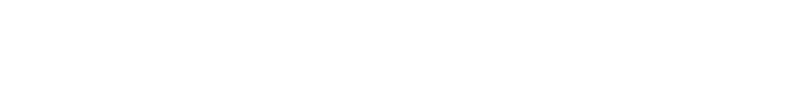

160/160 ━━━━━━━━━━━━━━━━━━━━ 44s 191ms/step - d_loss: 0.6410 - g_loss: 0.9229
Epoch 2/10
  1/160 ━━━━━━━━━━━━━━━━━━━━ 14:03 5s/step - d_loss: 0.0920 - g_loss: 2.4282

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


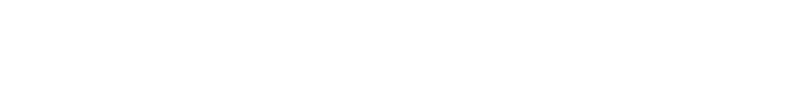

160/160 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - d_loss: 0.0920 - g_loss: 2.4282  
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - d_loss: 0.6166 - g_loss: 1.6582

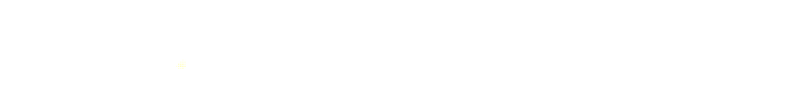

160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 186ms/step - d_loss: 0.6169 - g_loss: 1.6585
Epoch 4/10
  1/160 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - d_loss: 1.1394 - g_loss: 0.4897

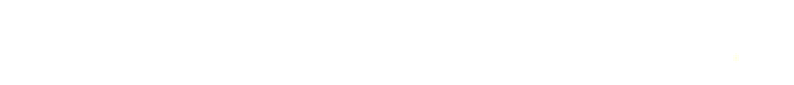

160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - d_loss: 1.1394 - g_loss: 0.4897 
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - d_loss: 0.6267 - g_loss: 1.2006

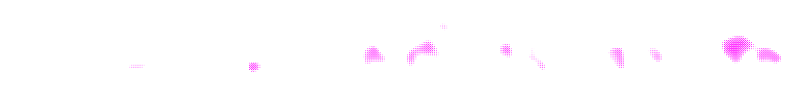

160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 186ms/step - d_loss: 0.6267 - g_loss: 1.2012
Epoch 6/10
  1/160 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - d_loss: 1.3374 - g_loss: 1.0565

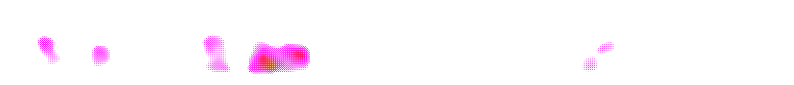

160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - d_loss: 1.3374 - g_loss: 1.0565 
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - d_loss: 0.7483 - g_loss: 1.4097

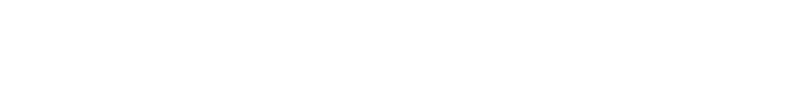

160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 188ms/step - d_loss: 0.7476 - g_loss: 1.4097
Epoch 8/10
  1/160 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - d_loss: 0.8419 - g_loss: 0.6790

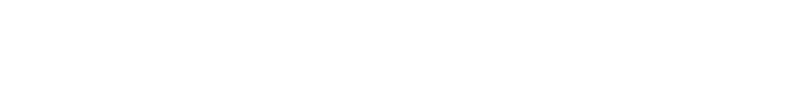

160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - d_loss: 0.8419 - g_loss: 0.6790 
Epoch 9/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - d_loss: 0.6766 - g_loss: 1.1007

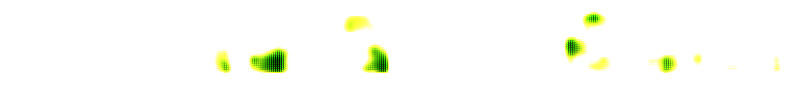

160/160 ━━━━━━━━━━━━━━━━━━━━ 30s 187ms/step - d_loss: 0.6764 - g_loss: 1.1025
Epoch 10/10
  1/160 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - d_loss: 1.0017 - g_loss: 0.8057

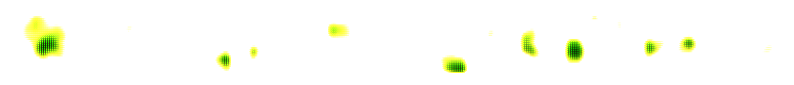

160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - d_loss: 1.0017 - g_loss: 0.8057 


In [ ]:
gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

epochs = 100
num_samples = len(artwork_dataset_focused_artist)  # Total images in dataset
batch_size = 32  # Batch size used in training
steps_per_epoch = num_samples // batch_size  # Number of steps per epoch

# Train the cGAN with fixed steps per epoch
gan.fit(tf_dataset, epochs=epochs, steps_per_epoch=steps_per_epoch,
        callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim)]
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


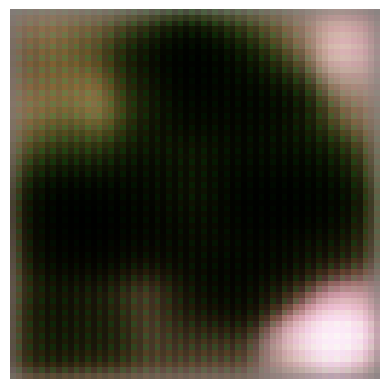

In [ ]:
random_noise = np.random.normal(size=(1, latent_dim))
# Generate image
generated_image = gan.generator.predict(random_noise)

# Display painting
plt.imshow(generated_image[0])
plt.axis("off")
plt.show()

#### cGAN

In [ ]:
import tensorflow as tf
import torch
from torch.utils.data import DataLoader
import numpy as np
from torchvision import transforms

def pytorch_to_tf_dataset(artwork_dataset, batch_size=32, shuffle=True, num_classes=2, network_dict=network_dict):
    """
    Converts an ArtworkDataset instance (PyTorch Dataset) to a TensorFlow tf.data.Dataset.

    Args:
        artwork_dataset (Dataset): Instance of ArtworkDataset.
        batch_size (int): Batch size for the TensorFlow dataset.
        shuffle (bool): Whether to shuffle the dataset.
        num_classes (int): Number of artist categories for one-hot encoding.

    Returns:
        tf.data.Dataset: TensorFlow dataset with (images, one-hot labels).
    """

    # Define transform to convert PIL to Tensor
    transform = transforms.ToTensor()  # Converts (H, W, C) → (C, H, W) & normalizes to [0,1]

    def collate_fn(batch):
        """Custom function to convert PIL images into tensors before batching"""
        images, _, indices = zip(*batch)  # Unpack batch (ignore labels)

        # Convert PIL images to tensors
        images = [transform(img) if isinstance(img, torch.Tensor) else transform(img) for img in images]

        # Stack tensors into a batch
        image_tensors = torch.stack(images)

        # Get artist labels (convert to one-hot encoding)
        label_artists = []
        network_artists = []

        for i in indices:
            artist_name = artwork_dataset.data[artwork_dataset.data["Artwork_ID"]==i]["Artist_name"]
            artist_index = focused_artists.get(artist_name.iloc[0], -1)  # Get artist index or default
            if artist_index == -1:
                one_hot_label = np.zeros(num_classes)  # Unknown artist → zero vector
            else:
                one_hot_label = np.zeros(num_classes)
                one_hot_label[artist_index] = 1  # One-hot encoding
            label_artists.append(one_hot_label)

            network_code = np.zeros(len(network_dict.keys()))
            connections = artwork_dataset.data[artwork_dataset.data["Artwork_ID"]==i]["Friends.and.Co.workers"]

            for k, idx in network_dict.items():
                if k in connections:
                    network_code[idx] = 1
                if k in connections:
                    network_code[idx] = 1
            network_artists.append(network_code)

        label_artists = torch.tensor(label_artists, dtype=torch.float32)  # Convert to tensor
        network_artists = torch.tensor(network_artists, dtype=torch.float32)  # Convert to tensor

        return image_tensors, label_artists, network_artists  # Return images + one-hot labels

    # PyTorch DataLoader for batching & shuffling with custom collate function
    dataloader = DataLoader(artwork_dataset, batch_size=batch_size, shuffle=shuffle, collate_fn=collate_fn)

    def generator():
        """Generator function for TensorFlow Dataset (returns images and labels)"""
        for image_tensors, artist_labels, network_labels in dataloader:
            # Convert (C, H, W) → (H, W, C) and normalize
            image_arrays = image_tensors.permute(0, 2, 3, 1).numpy().astype(np.float32)
            artist_labels = artist_labels.numpy().astype(np.float32)
            network_labels = network_labels.numpy().astype(np.float32)
            yield (image_arrays, artist_labels, network_labels)  # Return (image, label, network_labels)

    # Define TensorFlow dataset signature
    output_signature = (
        tf.TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32),  # Image batch
        tf.TensorSpec(shape=(None, num_classes), dtype=tf.float32),
        tf.TensorSpec(shape=(None, len(network_dict.keys())), dtype=tf.float32)
    )

    # Convert generator to TensorFlow dataset
    tf_dataset = tf.data.Dataset.from_generator(generator, output_signature=output_signature)

    # Batch and prefetch for performance
    tf_dataset = tf_dataset.repeat().prefetch(tf.data.AUTOTUNE)

    return tf_dataset

# Convert PyTorch dataset to TensorFlow dataset
tf_dataset = pytorch_to_tf_dataset(artwork_dataset_focused_artist, batch_size=32, num_classes=6, network_dict=network_dict)

# Check dataset output
for images, labels, networks in tf_dataset.take(1):
    print("Batch shape:", images.shape)  # Expected: (32, 64, 64, 3)
    print("Label shape:", labels.shape)  # Expected: (32, num_classes)
    print("Network shape:", networks.shape)  # Expected: (32, num_classes)


Batch shape: (32, 64, 64, 3)
Label shape: (32, 6)
Network shape: (32, 2)


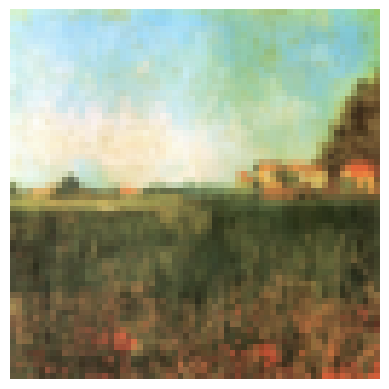

In [ ]:
## showing example

import matplotlib.pyplot as plt

# Iterate over the dataset
for images in tf_dataset.take(1):  # Unpack the tuple
    plt.axis("off")

    # Convert TensorFlow tensor to NumPy for visualization
    image = images[0].numpy()  # Convert the image batch to NumPy
    image = (image * 255).astype("int32")  # Rescale from [0,1] to [0,255]

    plt.imshow(image[0])  # Show the first image in the batch
    plt.show()
    break

In [ ]:
from tensorflow.keras.layers import Flatten, Dense, Input, Reshape, Concatenate
from tensorflow.keras.models import Model

latent_dim = 128
num_classes = 6  # One-hot vector size
network_label_dim = 2  # Two-dimensional network label

def build_discriminator(num_classes, network_label_dim):
    img_input = Input(shape=(64, 64, 3))  # Image input
    artist_label_input = Input(shape=(num_classes,))  # One-hot artist label
    network_label_input = Input(shape=(network_label_dim,))  # 2D network label

    # Flatten image input
    img_features = Flatten()(img_input)

    # Merge image, artist label, and network label
    merged = Concatenate()([img_features, artist_label_input, network_label_input])

    # Discriminator network
    x = Dense(512, activation="relu")(merged)
    x = Dense(256, activation="relu")(x)
    output = Dense(1, activation="sigmoid")(x)  # Real vs. Fake

    return Model([img_input, artist_label_input, network_label_input], output, name="discriminator")

# Build and summarize the modified discriminator
cdiscriminator = build_discriminator(num_classes, network_label_dim)
cdiscriminator.summary()


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 64, 64, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 12288)          │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 6)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 2)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 12296)          │              0 │ flatten[0][0],         │
│                           │                        │                │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │      6,296,064 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 256)            │        131,328 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1)              │            257 │ dense_1[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,427,649 (24.52 MB)

 Trainable params: 6,427,649 (24.52 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.layers import Conv2DTranspose, LeakyReLU

def build_generator(latent_dim, num_classes, network_label_dim):
    noise_input = Input(shape=(latent_dim,))
    artist_label_input = Input(shape=(num_classes,))  # One-hot artist label
    network_label_input = Input(shape=(network_label_dim,))  # 2D network label

    # Merge noise, artist label, and network label
    merged = Concatenate()([noise_input, artist_label_input, network_label_input])

    # Generator network
    x = Dense(8 * 8 * 128)(merged)
    x = Reshape((8, 8, 128))(x)
    x = Conv2DTranspose(128, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv2DTranspose(256, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Conv2DTranspose(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    img_output = Conv2DTranspose(3, kernel_size=5, padding="same", activation="sigmoid")(x)

    return Model([noise_input, artist_label_input, network_label_input], img_output, name="generator")

# Build and summarize the updated generator
cgenerator = build_generator(latent_dim, num_classes, network_label_dim)
cgenerator.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 128)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_10            │ (None, 6)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_11            │ (None, 2)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 136)            │              0 │ input_layer_9[0][0],   │
│ (Concatenate)             │                        │                │ input_layer_10[0][0],  │
│                           │                        │                │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 8192)           │      1,122,304 │ concatenate_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_2 (Reshape)       │ (None, 8, 8, 128)      │              0 │ dense_5[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_1        │ (None, 16, 16, 128)    │        262,272 │ reshape_2[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 16, 16, 128)    │              0 │ conv2d_transpose_1[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_2        │ (None, 32, 32, 256)    │        524,544 │ leaky_re_lu[0][0]      │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 32, 32, 256)    │              0 │ conv2d_transpose_2[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_3        │ (None, 64, 64, 512)    │      2,097,664 │ leaky_re_lu_1[0][0]    │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 64, 64, 512)    │              0 │ conv2d_transpose_3[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_4        │ (None, 64, 64, 3)      │         38,403 │ leaky_re_lu_2[0][0]    │
│ (Conv2DTranspose)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 4,045,187 (15.43 MB)

 Trainable params: 4,045,187 (15.43 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class cGAN(keras.Model):
    def __init__(self, latent_dim, num_classes, network_size):
        """
        Initializes the cGAN model with a generator and discriminator.

        Args:
            latent_dim (int): Dimension of the noise vector.
            num_classes (int): Number of artist categories for conditional generation.
            network_size (int): Number of network relationship categories.
        """
        super(cGAN, self).__init__()
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        self.network_size = network_size

        # Build Generator & Discriminator inside the class
        self.generator = self.build_generator()
        self.discriminator = self.build_discriminator()

    def build_generator(self):
        """Build the Generator network inside the cGAN class"""
        noise_input = layers.Input(shape=(self.latent_dim,))
        artist_label_input = layers.Input(shape=(self.num_classes,))
        network_label_input = layers.Input(shape=(self.network_size,))

        # Combine noise, artist label, and network label
        combined_input = layers.Concatenate()([noise_input, artist_label_input, network_label_input])

        x = layers.Dense(8 * 8 * 256, use_bias=False)(combined_input)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Reshape((8, 8, 256))(x)

        x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2DTranspose(3, kernel_size=4, strides=2, padding="same", activation="tanh")(x)

        return keras.Model([noise_input, artist_label_input, network_label_input], x, name="generator")

    def build_discriminator(self):
        """Build the Discriminator network inside the cGAN class"""
        image_input = layers.Input(shape=(64, 64, 3))
        artist_label_input = layers.Input(shape=(self.num_classes,))
        network_label_input = layers.Input(shape=(self.network_size,))

        # Expand label to match image dimensions
        artist_embedding = layers.Dense(64 * 64 * 1)(artist_label_input)
        artist_embedding = layers.Reshape((64, 64, 1))(artist_embedding)

        network_embedding = layers.Dense(64 * 64 * 1)(network_label_input)
        network_embedding = layers.Reshape((64, 64, 1))(network_embedding)

        # Combine image and labels
        x = layers.Concatenate()([image_input, artist_embedding, network_embedding])

        x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Flatten()(x)
        x = layers.Dense(1, activation="sigmoid")(x)

        return keras.Model([image_input, artist_label_input, network_label_input], x, name="discriminator")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        """Compile the cGAN with optimizers and loss function"""
        super(cGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        """Return loss metrics"""
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, data):
        """Single training step for the cGAN"""
        real_images, artist_labels, network_labels = data

        # Ensure labels are one-hot encoded
        artist_labels_one_hot = tf.reshape(tf.cast(artist_labels, tf.float32), (-1, self.num_classes))
        network_labels_one_hot = tf.reshape(tf.cast(network_labels, tf.float32), (-1, len(network_dict.keys())))

        # Generate fake images
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        generated_images = self.generator([random_latent_vectors, artist_labels_one_hot, network_labels_one_hot])

        # Create labels for real and fake images
        real_labels = tf.ones((batch_size, 1)) * 0.9  # Label smoothing
        fake_labels = tf.zeros((batch_size, 1)) + 0.1  # Label smoothing

        # Train the discriminator
        with tf.GradientTape() as tape:
            real_preds = self.discriminator([real_images, artist_labels_one_hot, network_labels_one_hot])
            fake_preds = self.discriminator([generated_images, artist_labels_one_hot, network_labels_one_hot])
            d_loss_real = self.loss_fn(real_labels, real_preds)
            d_loss_fake = self.loss_fn(fake_labels, fake_preds)
            d_loss = (d_loss_real + d_loss_fake) / 2
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))

        # Train the generator
        misleading_labels = tf.ones((batch_size, 1))
        with tf.GradientTape() as tape:
            fake_images = self.generator([random_latent_vectors, artist_labels_one_hot, network_labels_one_hot])
            fake_preds = self.discriminator([fake_images, artist_labels_one_hot, network_labels_one_hot])
            g_loss = self.loss_fn(misleading_labels, fake_preds)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update loss metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}


In [ ]:
import matplotlib.pyplot as plt

class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128, num_classes=3, network_size=5):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        self.network_size = network_size

    def on_epoch_end(self, epoch, logs=None):
        """Generates and saves images at the end of each epoch"""
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))

        # Generate random labels
        random_artist_labels = tf.one_hot(tf.random.uniform((self.num_img,), maxval=self.num_classes, dtype=tf.int32), depth=self.num_classes)
        random_network_labels = tf.one_hot(tf.random.uniform((self.num_img,), maxval=self.network_size, dtype=tf.int32), depth=self.network_size)

        generated_images = self.model.generator([random_latent_vectors, random_artist_labels, random_network_labels])
        generated_images = (generated_images + 1) / 2  # Rescale [-1,1] → [0,1]

        plt.figure(figsize=(self.num_img, self.num_img))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i + 1)
            plt.imshow(generated_images[i])
            plt.axis("off")
        plt.show()


Epoch 1/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - d_loss: 0.5124 - g_loss: 1.2804

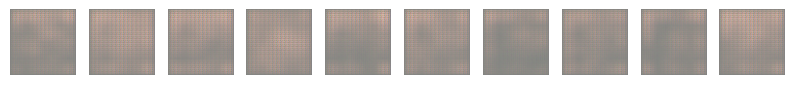

203/203 ━━━━━━━━━━━━━━━━━━━━ 52s 217ms/step - d_loss: 0.5120 - g_loss: 1.2833
Epoch 2/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - d_loss: 0.4410 - g_loss: 2.5132

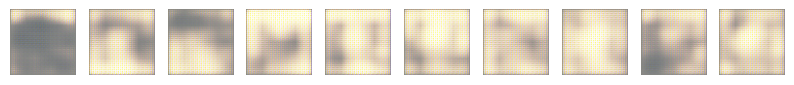

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 217ms/step - d_loss: 0.4411 - g_loss: 2.5157
Epoch 3/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.4579 - g_loss: 2.8156

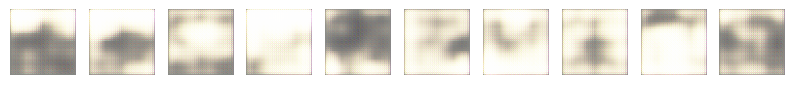

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.4579 - g_loss: 2.8136
Epoch 4/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.3933 - g_loss: 2.1260

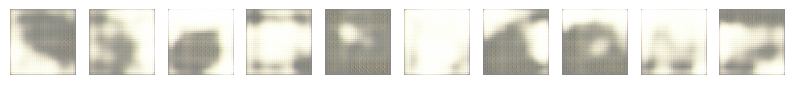

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 220ms/step - d_loss: 0.3933 - g_loss: 2.1263
Epoch 5/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.3941 - g_loss: 2.0349

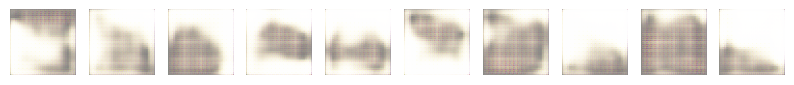

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.3942 - g_loss: 2.0345
Epoch 6/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.4184 - g_loss: 1.8146

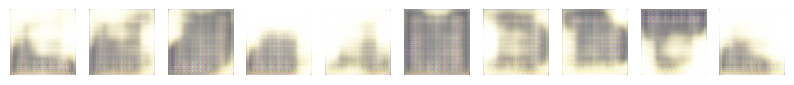

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.4185 - g_loss: 1.8145
Epoch 7/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_loss: 0.5219 - g_loss: 1.5636

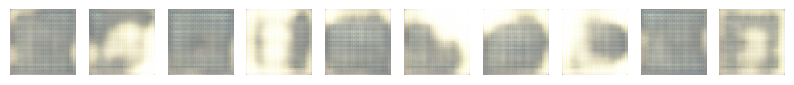

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - d_loss: 0.5219 - g_loss: 1.5637
Epoch 8/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_loss: 0.5039 - g_loss: 1.8573

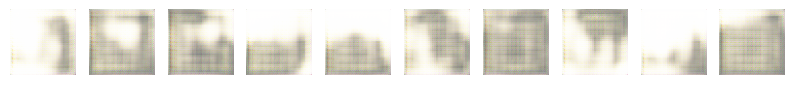

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - d_loss: 0.5040 - g_loss: 1.8575
Epoch 9/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5320 - g_loss: 1.9478

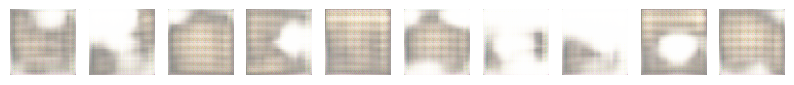

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - d_loss: 0.5320 - g_loss: 1.9480
Epoch 10/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5450 - g_loss: 1.5902

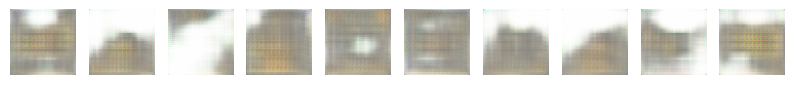

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5449 - g_loss: 1.5898
Epoch 11/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5898 - g_loss: 1.2519

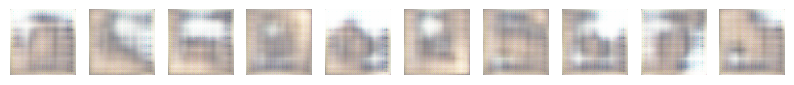

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 231ms/step - d_loss: 0.5896 - g_loss: 1.2526
Epoch 12/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5996 - g_loss: 1.7703

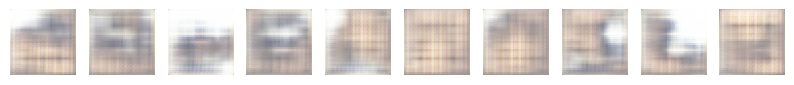

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - d_loss: 0.5996 - g_loss: 1.7693
Epoch 13/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5470 - g_loss: 1.4482

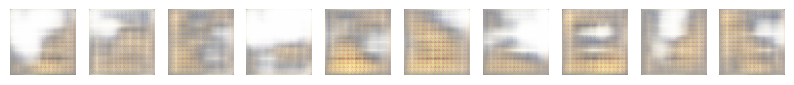

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.5469 - g_loss: 1.4481
Epoch 14/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5960 - g_loss: 1.4391

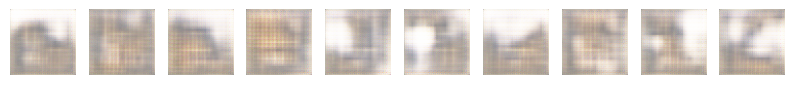

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5959 - g_loss: 1.4404
Epoch 15/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.6316 - g_loss: 1.5469

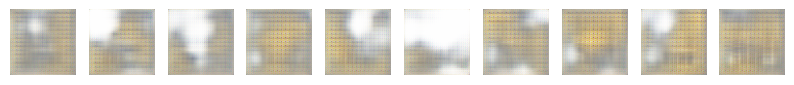

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.6316 - g_loss: 1.5460
Epoch 16/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_loss: 0.5087 - g_loss: 1.4945

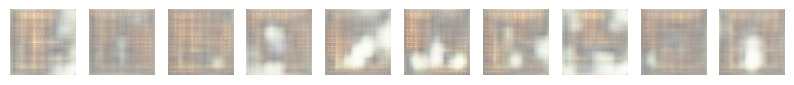

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - d_loss: 0.5091 - g_loss: 1.4934
Epoch 17/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.4988 - g_loss: 1.5053

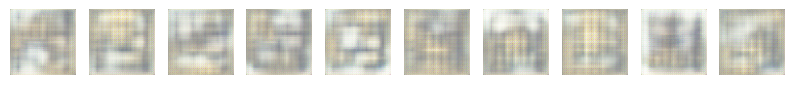

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.4990 - g_loss: 1.5051
Epoch 18/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5804 - g_loss: 1.7787

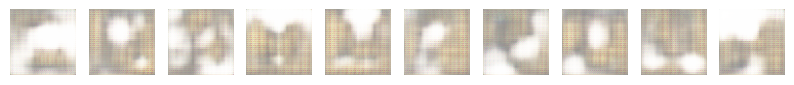

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5804 - g_loss: 1.7781
Epoch 19/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_loss: 0.5537 - g_loss: 1.3818

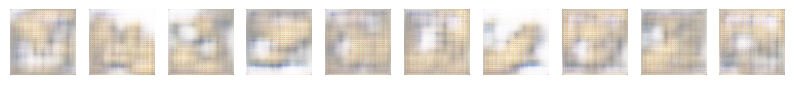

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 227ms/step - d_loss: 0.5540 - g_loss: 1.3821
Epoch 20/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5678 - g_loss: 1.6894

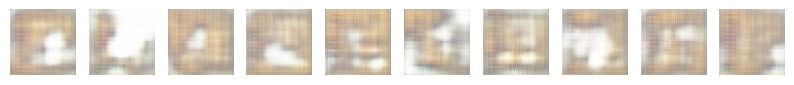

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5676 - g_loss: 1.6884
Epoch 21/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5926 - g_loss: 1.3666

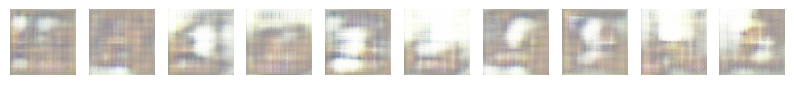

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5924 - g_loss: 1.3670
Epoch 22/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_loss: 0.5703 - g_loss: 1.3216

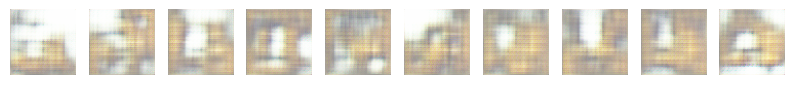

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - d_loss: 0.5702 - g_loss: 1.3221
Epoch 23/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5752 - g_loss: 1.3293

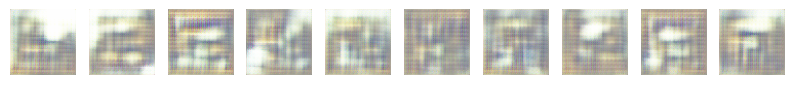

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5753 - g_loss: 1.3287
Epoch 24/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.7009 - g_loss: 1.6581

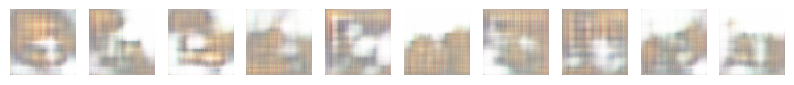

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.7004 - g_loss: 1.6572
Epoch 25/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6008 - g_loss: 1.3794

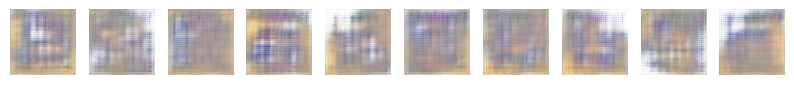

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6008 - g_loss: 1.3798
Epoch 26/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6146 - g_loss: 1.5944

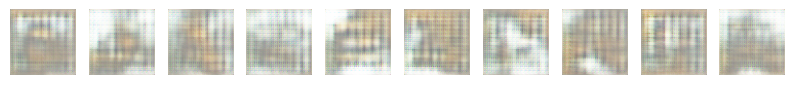

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - d_loss: 0.6147 - g_loss: 1.5945
Epoch 27/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6107 - g_loss: 1.5465

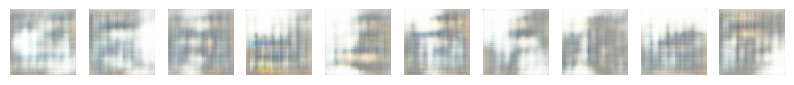

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6105 - g_loss: 1.5479
Epoch 28/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5822 - g_loss: 1.8759

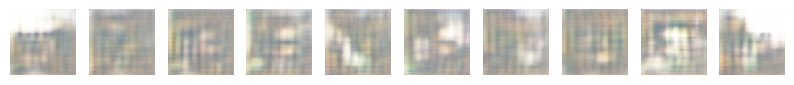

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5822 - g_loss: 1.8742
Epoch 29/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5810 - g_loss: 1.1766

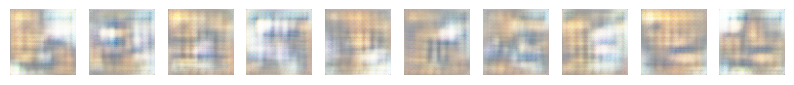

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5810 - g_loss: 1.1771
Epoch 30/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5805 - g_loss: 1.2991

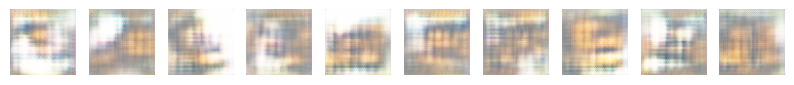

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5805 - g_loss: 1.2997
Epoch 31/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6393 - g_loss: 1.2134

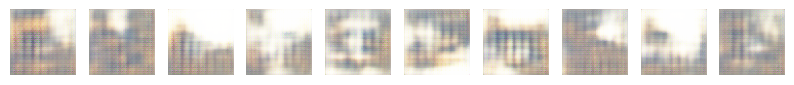

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6393 - g_loss: 1.2135
Epoch 32/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5457 - g_loss: 1.5018

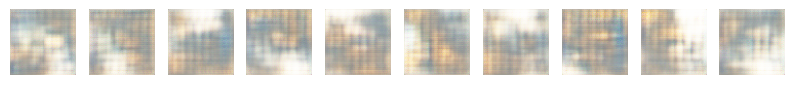

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.5458 - g_loss: 1.5016
Epoch 33/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6282 - g_loss: 1.1954

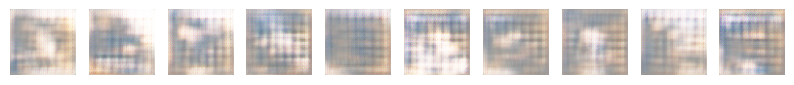

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6281 - g_loss: 1.1958
Epoch 34/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5951 - g_loss: 1.2180

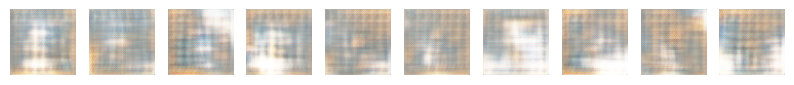

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5951 - g_loss: 1.2190
Epoch 35/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_loss: 0.6705 - g_loss: 1.3137

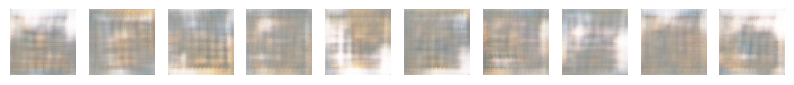

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 231ms/step - d_loss: 0.6703 - g_loss: 1.3149
Epoch 36/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5945 - g_loss: 1.3281

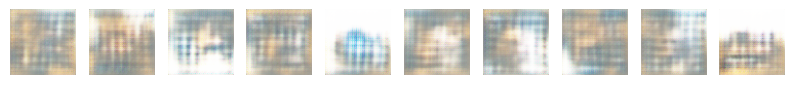

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5944 - g_loss: 1.3286
Epoch 37/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.6935 - g_loss: 1.5399

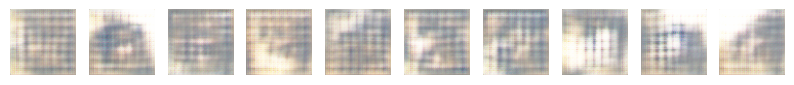

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.6931 - g_loss: 1.5395
Epoch 38/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5062 - g_loss: 1.3094

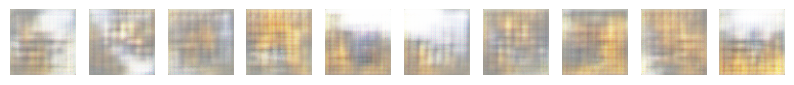

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.5064 - g_loss: 1.3088
Epoch 39/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6062 - g_loss: 1.1371

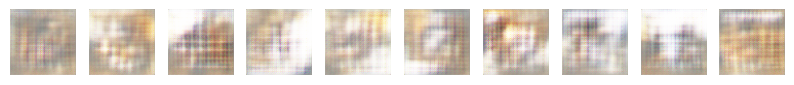

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6063 - g_loss: 1.1381
Epoch 40/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_loss: 0.6047 - g_loss: 1.3440

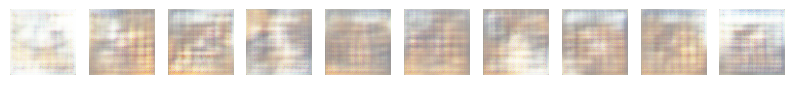

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - d_loss: 0.6048 - g_loss: 1.3436
Epoch 41/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_loss: 0.5595 - g_loss: 1.1749

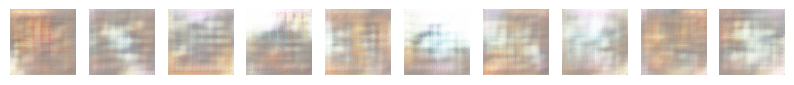

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - d_loss: 0.5597 - g_loss: 1.1748
Epoch 42/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6151 - g_loss: 1.4421

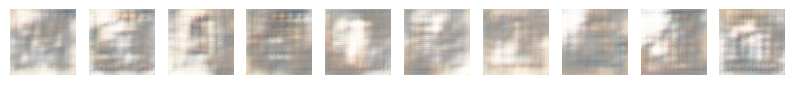

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6152 - g_loss: 1.4418
Epoch 43/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6184 - g_loss: 1.2119

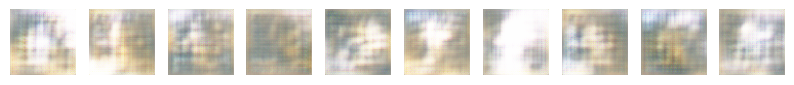

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6184 - g_loss: 1.2125
Epoch 44/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6214 - g_loss: 1.0868

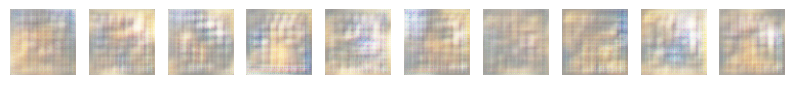

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6215 - g_loss: 1.0872
Epoch 45/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.6265 - g_loss: 1.4029

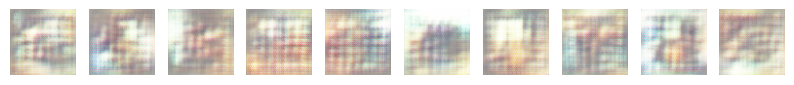

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.6265 - g_loss: 1.4033
Epoch 46/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5618 - g_loss: 1.2325

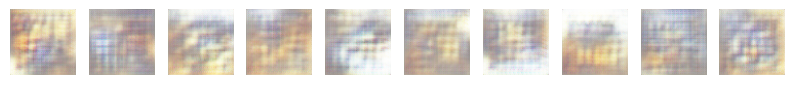

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5619 - g_loss: 1.2323
Epoch 47/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - d_loss: 0.6645 - g_loss: 1.0440

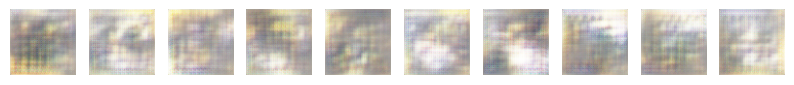

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - d_loss: 0.6642 - g_loss: 1.0444
Epoch 48/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - d_loss: 0.6360 - g_loss: 1.3451

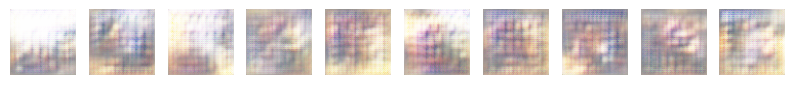

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6362 - g_loss: 1.3448
Epoch 49/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_loss: 0.6054 - g_loss: 1.2168

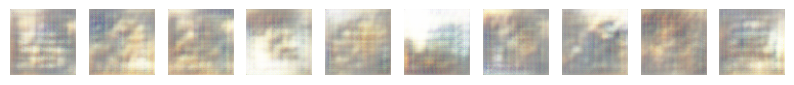

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 231ms/step - d_loss: 0.6055 - g_loss: 1.2163
Epoch 50/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.5841 - g_loss: 1.0980

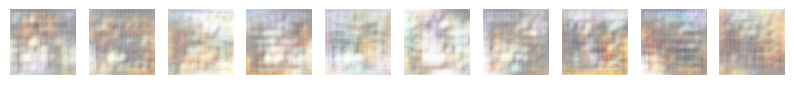

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.5841 - g_loss: 1.0981
Epoch 51/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_loss: 0.6348 - g_loss: 1.1226

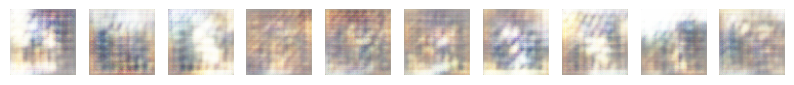

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 228ms/step - d_loss: 0.6347 - g_loss: 1.1235
Epoch 52/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_loss: 0.5939 - g_loss: 1.1984

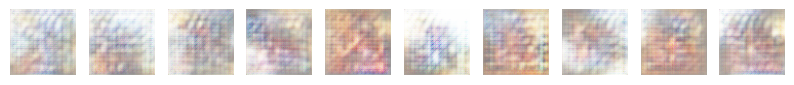

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 229ms/step - d_loss: 0.5940 - g_loss: 1.1983
Epoch 53/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - d_loss: 0.6721 - g_loss: 1.2671

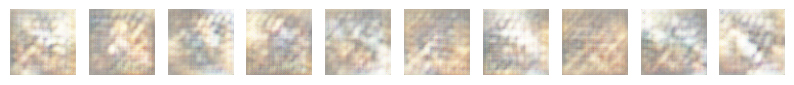

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - d_loss: 0.6719 - g_loss: 1.2668
Epoch 54/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_loss: 0.6327 - g_loss: 1.1106

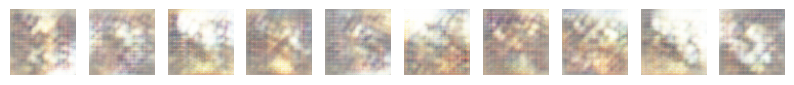

203/203 ━━━━━━━━━━━━━━━━━━━━ 47s 230ms/step - d_loss: 0.6328 - g_loss: 1.1107
Epoch 55/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6485 - g_loss: 0.9645

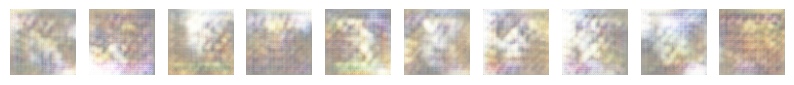

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6485 - g_loss: 0.9648
Epoch 56/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - d_loss: 0.6824 - g_loss: 1.2154

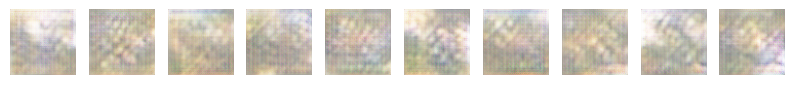

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 224ms/step - d_loss: 0.6823 - g_loss: 1.2149
Epoch 57/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6131 - g_loss: 1.1083

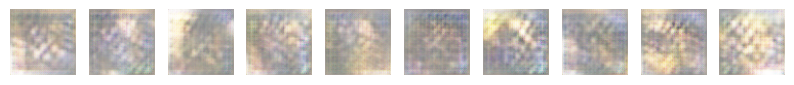

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.6131 - g_loss: 1.1086
Epoch 58/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - d_loss: 0.6397 - g_loss: 1.1108

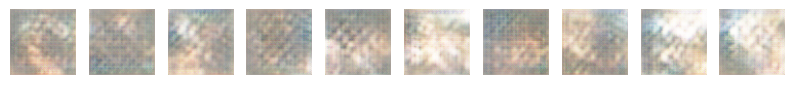

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - d_loss: 0.6397 - g_loss: 1.1105
Epoch 59/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - d_loss: 0.6187 - g_loss: 1.1434

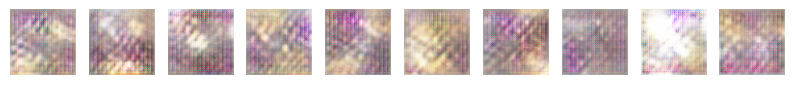

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6190 - g_loss: 1.1439
Epoch 60/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.6647 - g_loss: 2.2349

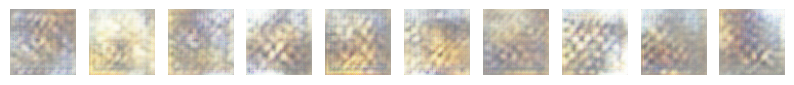

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6645 - g_loss: 2.2315
Epoch 61/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - d_loss: 0.6577 - g_loss: 1.0860

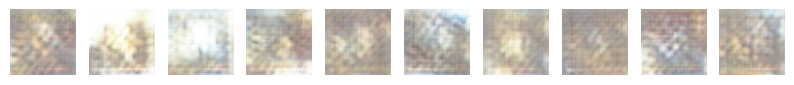

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - d_loss: 0.6578 - g_loss: 1.0861
Epoch 62/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - d_loss: 0.5907 - g_loss: 1.1680

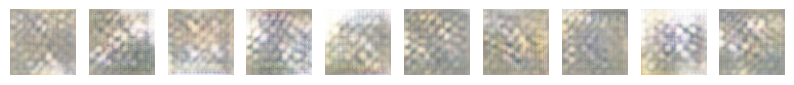

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 223ms/step - d_loss: 0.5907 - g_loss: 1.1680
Epoch 63/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - d_loss: 0.6452 - g_loss: 1.0785

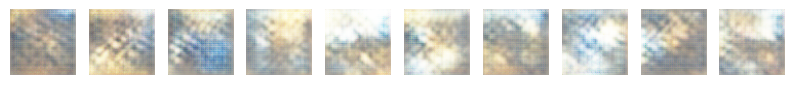

203/203 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - d_loss: 0.6450 - g_loss: 1.0787
Epoch 64/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - d_loss: 0.6267 - g_loss: 1.1709

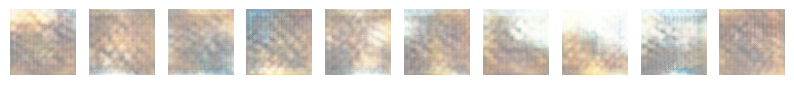

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6266 - g_loss: 1.1708
Epoch 65/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6109 - g_loss: 1.0960

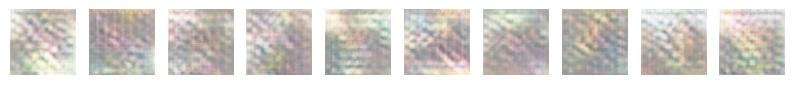

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6110 - g_loss: 1.0961
Epoch 66/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6469 - g_loss: 1.1142

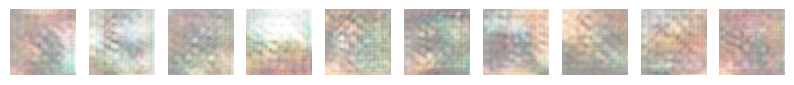

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 220ms/step - d_loss: 0.6468 - g_loss: 1.1140
Epoch 67/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6454 - g_loss: 1.0859

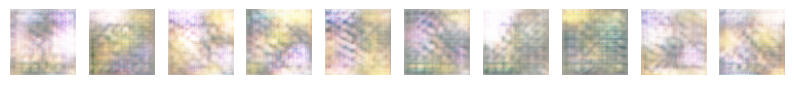

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6454 - g_loss: 1.0857
Epoch 68/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.5862 - g_loss: 1.0811

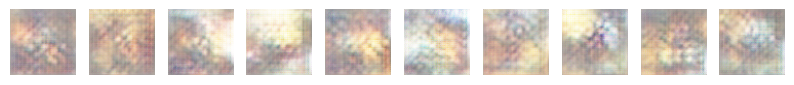

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.5863 - g_loss: 1.0810
Epoch 69/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6309 - g_loss: 1.0117

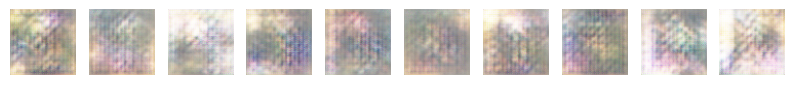

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6310 - g_loss: 1.0119
Epoch 70/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6806 - g_loss: 1.0310

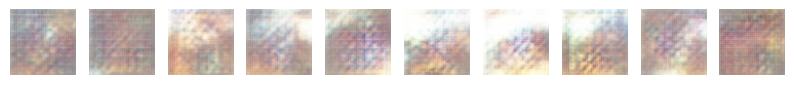

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6804 - g_loss: 1.0309
Epoch 71/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6653 - g_loss: 1.0403

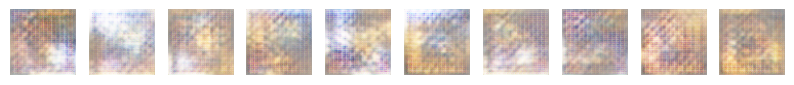

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6653 - g_loss: 1.0404
Epoch 72/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.6611 - g_loss: 1.0837

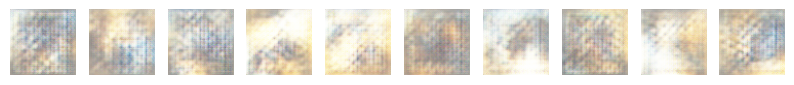

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.6610 - g_loss: 1.0837
Epoch 73/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6591 - g_loss: 1.1118

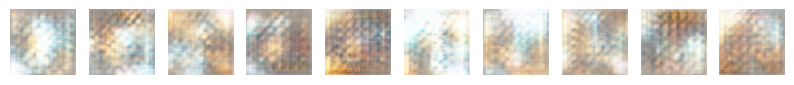

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6592 - g_loss: 1.1117
Epoch 74/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - d_loss: 0.6504 - g_loss: 1.2712

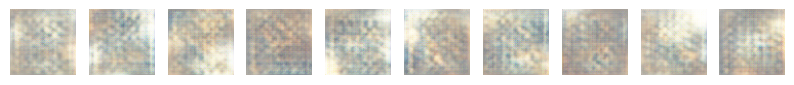

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6504 - g_loss: 1.2711
Epoch 75/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6217 - g_loss: 1.2168

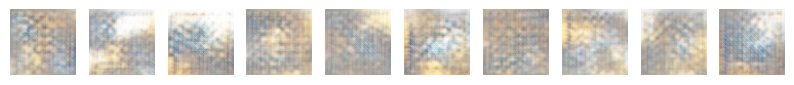

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6217 - g_loss: 1.2167
Epoch 76/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6155 - g_loss: 0.9420

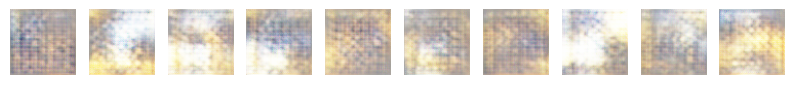

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6155 - g_loss: 0.9422
Epoch 77/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.5967 - g_loss: 1.0768

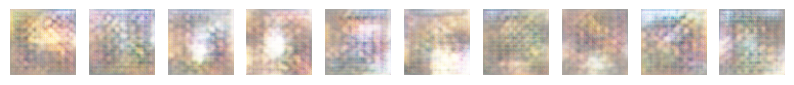

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.5967 - g_loss: 1.0767
Epoch 78/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - d_loss: 0.6174 - g_loss: 1.0153

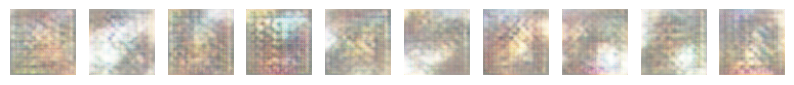

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6175 - g_loss: 1.0152
Epoch 79/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6506 - g_loss: 1.0165

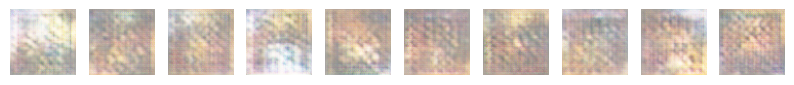

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6506 - g_loss: 1.0169
Epoch 80/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6491 - g_loss: 1.1322

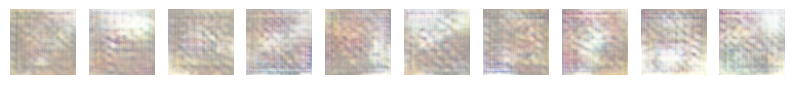

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6490 - g_loss: 1.1323
Epoch 81/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.6527 - g_loss: 1.0318

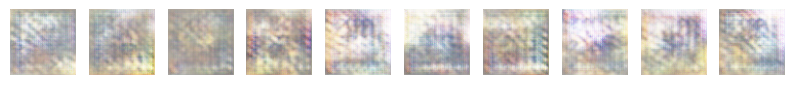

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.6526 - g_loss: 1.0320
Epoch 82/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6257 - g_loss: 1.2082

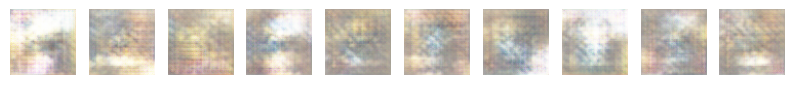

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6259 - g_loss: 1.2079
Epoch 83/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.5960 - g_loss: 0.9758

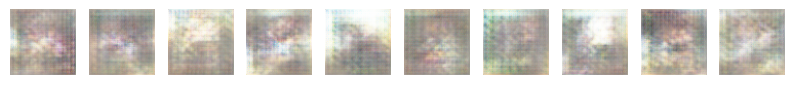

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.5962 - g_loss: 0.9756
Epoch 84/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6244 - g_loss: 1.0320

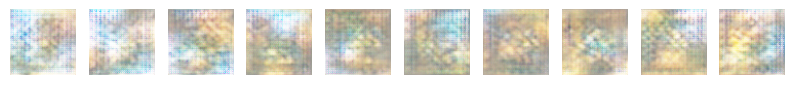

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6245 - g_loss: 1.0322
Epoch 85/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6173 - g_loss: 1.1893

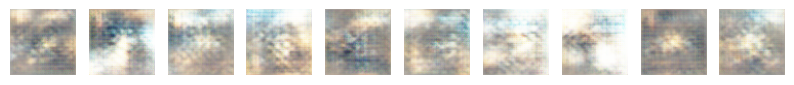

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6174 - g_loss: 1.1890
Epoch 86/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6344 - g_loss: 1.0047

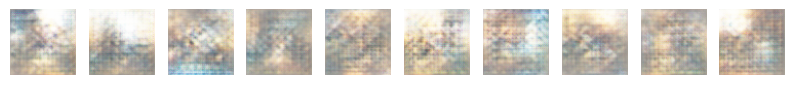

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 222ms/step - d_loss: 0.6343 - g_loss: 1.0047
Epoch 87/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.6325 - g_loss: 0.9699

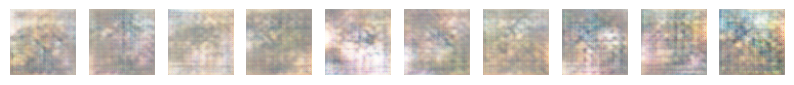

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.6324 - g_loss: 0.9698
Epoch 88/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6592 - g_loss: 0.9293

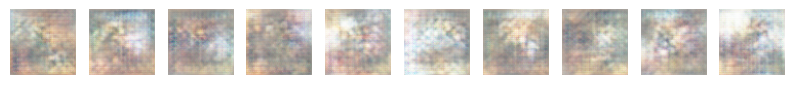

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6592 - g_loss: 0.9297
Epoch 89/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6980 - g_loss: 1.0148

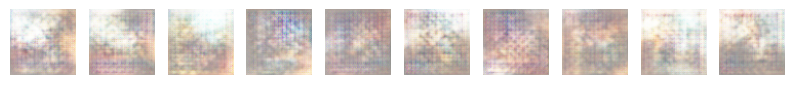

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6978 - g_loss: 1.0152
Epoch 90/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6243 - g_loss: 1.1763

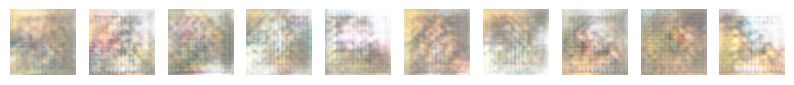

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6244 - g_loss: 1.1759
Epoch 91/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6028 - g_loss: 1.2007

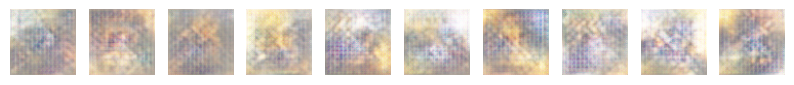

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6029 - g_loss: 1.2000
Epoch 92/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6522 - g_loss: 0.9896

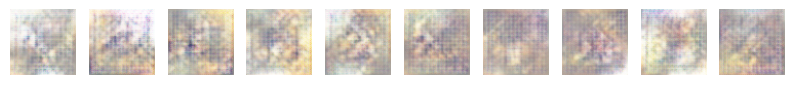

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6522 - g_loss: 0.9895
Epoch 93/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - d_loss: 0.6373 - g_loss: 1.0134

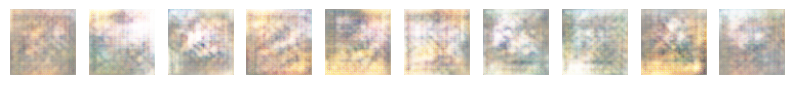

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6373 - g_loss: 1.0134
Epoch 94/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6268 - g_loss: 1.1123

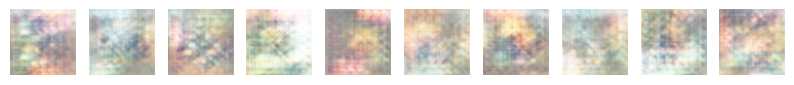

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6269 - g_loss: 1.1117
Epoch 95/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - d_loss: 0.6421 - g_loss: 0.9714

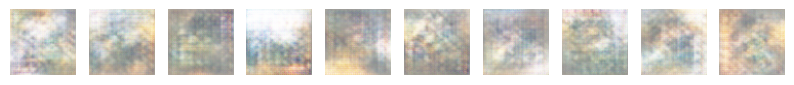

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 221ms/step - d_loss: 0.6421 - g_loss: 0.9714
Epoch 96/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6838 - g_loss: 1.0761

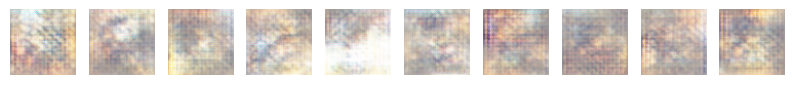

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6838 - g_loss: 1.0763
Epoch 97/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.7119 - g_loss: 1.0689

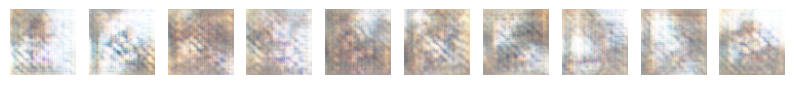

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.7116 - g_loss: 1.0693
Epoch 98/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - d_loss: 0.6513 - g_loss: 1.2040

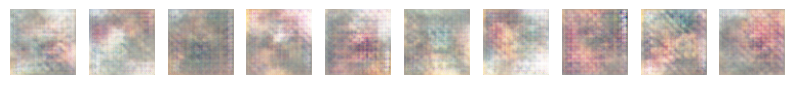

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 218ms/step - d_loss: 0.6512 - g_loss: 1.2034
Epoch 99/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - d_loss: 0.6469 - g_loss: 0.8485

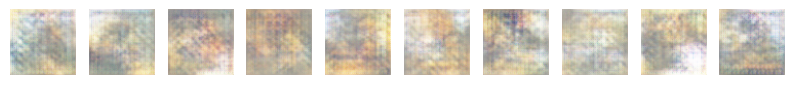

203/203 ━━━━━━━━━━━━━━━━━━━━ 45s 220ms/step - d_loss: 0.6469 - g_loss: 0.8485
Epoch 100/100
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - d_loss: 0.6425 - g_loss: 0.9707

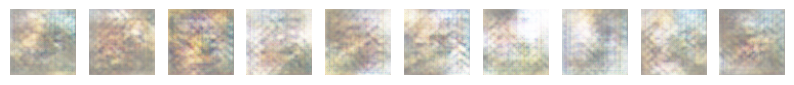

203/203 ━━━━━━━━━━━━━━━━━━━━ 44s 219ms/step - d_loss: 0.6426 - g_loss: 0.9706
Mounted at /content/drive


ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=/content/drive/MyDrive/cGAN_models/generator_model.

In [ ]:
# Number of artists & network connections
num_classes = 6  # Number of artist labels
network_size = len(network_dict.keys())  # Number of network categories

latent_dim = 128  # Noise vector size

# Create cGAN model with network labels
cgan = cGAN(latent_dim=latent_dim, num_classes=num_classes, network_size=network_size)

# Compile the model with optimizers and loss function
cgan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

# Define training parameters
epochs = 100
num_samples = len(artwork_dataset_focused_artist)  # Total images in dataset
batch_size = 32  # Batch size used in training
steps_per_epoch = num_samples // batch_size  # Number of steps per epoch

# Train the cGAN with fixed steps per epoch
cgan.fit(
    tf_dataset,
    epochs=epochs,
    steps_per_epoch=steps_per_epoch,
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, num_classes=num_classes, network_size=network_size)]
)

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Save models
#gan.generator.save("/content/drive/MyDrive/GAN_models/generator_model")
#gan.discriminator.save("/content/drive/MyDrive/GAN_models/discriminator_model")
cgan.save("/content/drive/MyDrive/cGAN_models/cgan_100epoch.keras")
cgan.generator.save("/content/drive/MyDrive/cGAN_models/generator_model.keras")
cgan.discriminator.save("/content/drive/MyDrive/cGAN_models/discriminator_model.keras")

In [ ]:
from tensorflow import keras
generator_model = keras.models.load_model("/content/drive/MyDrive/cGAN_models/generator_model.keras")
discriminator_model = keras.models.load_model("/content/drive/MyDrive/cGAN_models/discriminator_model.keras")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from google.colab import drive
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
import numpy as np

latent_dim = 128
random_noise = np.random.normal(size=(1, latent_dim))

In [ ]:
random_noise.shape

(1, 128)

In [ ]:
np.save("/content/drive/MyDrive/random_noise.npy", random_noise)

In [ ]:
random_noise = np.load("/content/drive/MyDrive/random_noise.npy")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


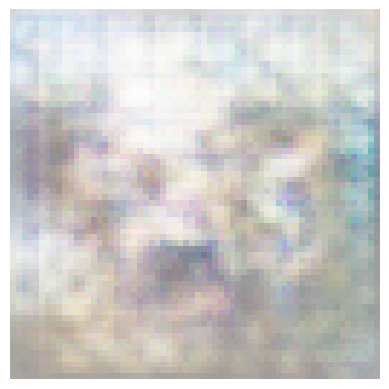

In [ ]:
# Define artist label (one-hot vector) -> Monet
artist_label = np.array([[1, 0, 0, 0, 0, 0]])

# Define network label (one-hot vector)
network_label = np.array([[0, 0]])

# Generate an image using the trained cGAN model
generated_image_monet = generator_model.predict([random_noise, artist_label, network_label])

# Rescale image from [-1,1] to [0,1]
generated_image_monet = (generated_image_monet + 1) / 2

# Display generated painting
plt.imshow(generated_image_monet[0])
plt.axis("off")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


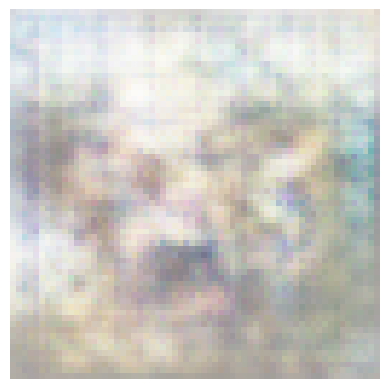

In [ ]:
# Define artist label (one-hot vector) -> van Gogh
artist_label = np.array([[0, 1, 0, 0, 0, 0]])

# Define network label (one-hot vector)
network_label = np.array([[0, 0]])

# Generate an image using the trained cGAN model
generated_image_vangogh = generator_model.predict([random_noise, artist_label, network_label])

# Rescale image from [-1,1] to [0,1]
generated_image_vangogh = (generated_image_vangogh + 1) / 2

# Display generated painting
plt.imshow(generated_image_vangogh[0])
plt.axis("off")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


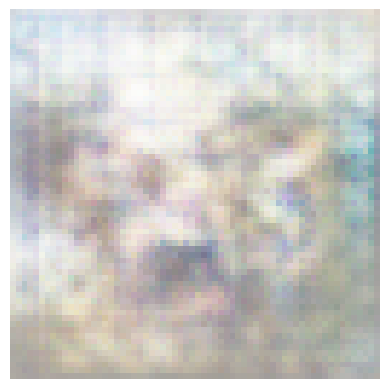

In [ ]:
# Define artist label (one-hot vector) -> Mixed
artist_label = np.array([[0.5, 0.5, 0, 0, 0, 0]])

# Define network label (one-hot vector)
network_label = np.array([[0, 0]])

# Generate an image using the trained cGAN model
generated_image_mixed = generator_model.predict([random_noise, artist_label, network_label])

# Rescale image from [-1,1] to [0,1]
generated_image_mixed = (generated_image_mixed + 1) / 2

# Display generated painting
plt.imshow(generated_image_mixed[0])
plt.axis("off")
plt.show()

#### Similarity Comparison based on VGG

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from scipy.spatial.distance import cosine
from PIL import Image

focused_artists = {"claude-monet": 0,
                   "vincent-van-gogh": 1,
                   "pierre-auguste-renoir": 2,
                   "camille-pissarro": 3,
                   "charles-laval": 4,
                   "paul-gauguin": 5}

network_dict = {"claude-monet": 0, "vincent-van-gogh": 1}

# Load pre-trained VGG16 model (without classifier)
vgg_model = VGG16(weights="imagenet", include_top=False, pooling="avg")

def pil_to_np(image):
    """Convert a PIL image to a NumPy array."""
    return np.array(image)

def extract_features(image):
    """Extract deep features from an image using VGG16."""
    if isinstance(image, np.ndarray):  # Convert NumPy array to PIL image if needed
        image = Image.fromarray((image * 255).astype(np.uint8))  # Ensure format

    image = image.resize((224, 224))  # Resize to match VGG16 input size
    image_np = np.expand_dims(pil_to_np(image), axis=0)  # Add batch dimension
    image_np = preprocess_input(image_np)  # Preprocess for VGG16

    return vgg_model.predict(image_np).flatten()  # Extract features

def cosine_similarity(image1, image2):
    """Compute Cosine Similarity between two image feature vectors."""
    feature1, feature2 = extract_features(image1), extract_features(image2)
    return 1 - cosine(feature1, feature2)  # Cosine similarity range: [0,1]

cos_sim = cosine_similarity(generated_image_monet[0], generated_image_mixed[0])
print(f"Cosine Similarity: {cos_sim:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Cosine Similarity: 0.8425


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
claude-monet vs vincent-van-gogh
Cosine Similarity: 0.9892
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_without_network_effect.png


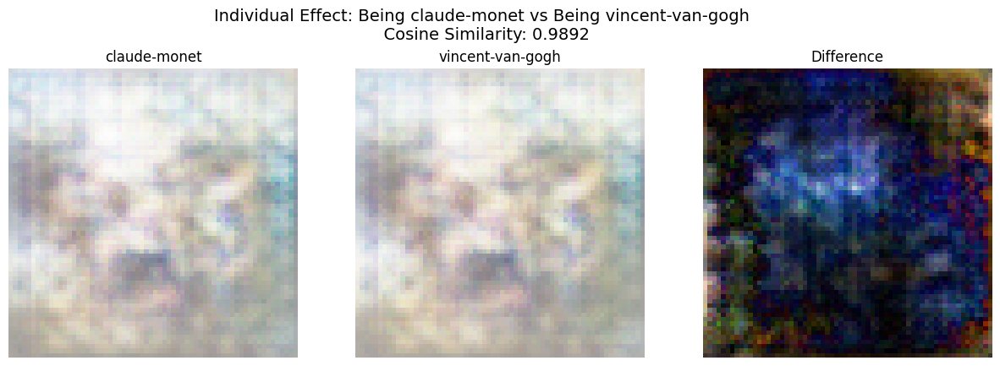

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
claude-monet vs pierre-auguste-renoir
Cosine Similarity: 0.9055
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_pierre-auguste-renoir_without_network_effect.png


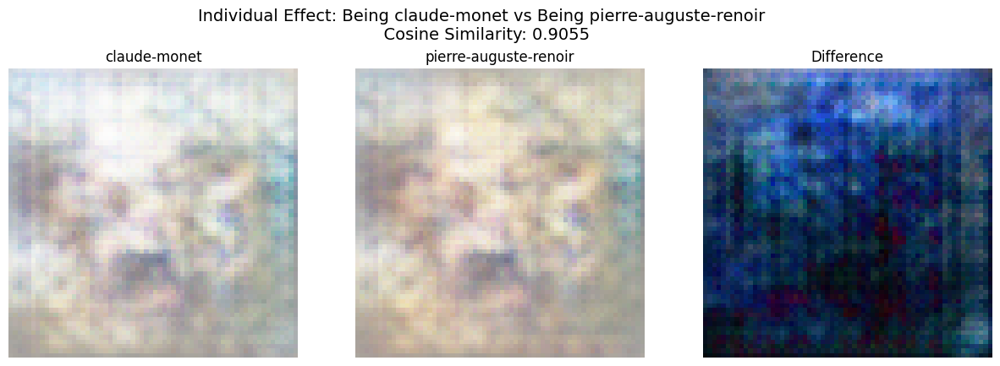

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
claude-monet vs camille-pissarro
Cosine Similarity: 0.9890
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_camille-pissarro_without_network_effect.png


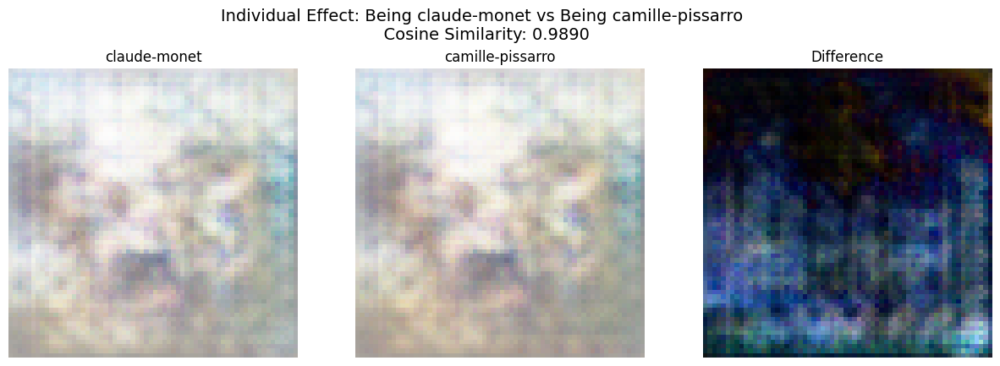

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
claude-monet vs charles-laval
Cosine Similarity: 0.9580
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_charles-laval_without_network_effect.png


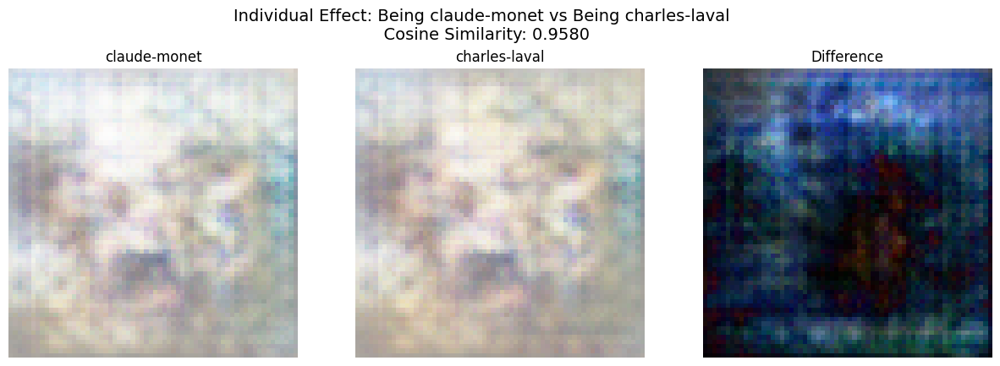

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
claude-monet vs paul-gauguin
Cosine Similarity: 0.9487
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_paul-gauguin_without_network_effect.png


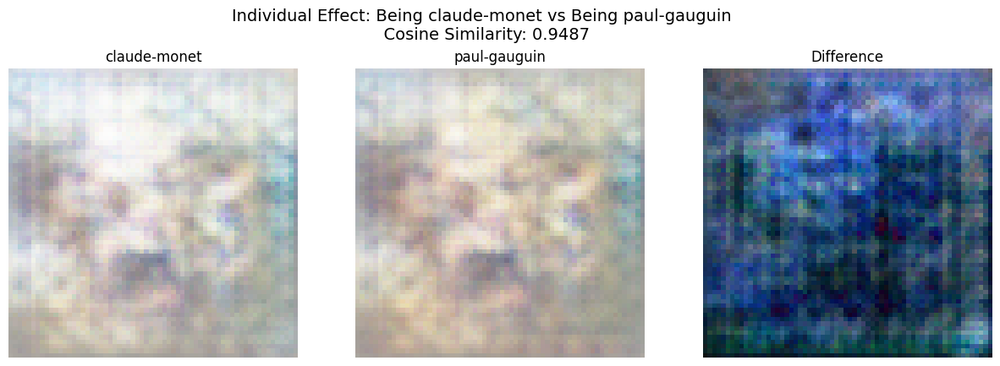

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
vincent-van-gogh vs pierre-auguste-renoir
Cosine Similarity: 0.9001
Saved: /content/drive/MyDrive/cGAN_models/img/vincent-van-gogh_vs_pierre-auguste-renoir_without_network_effect.png


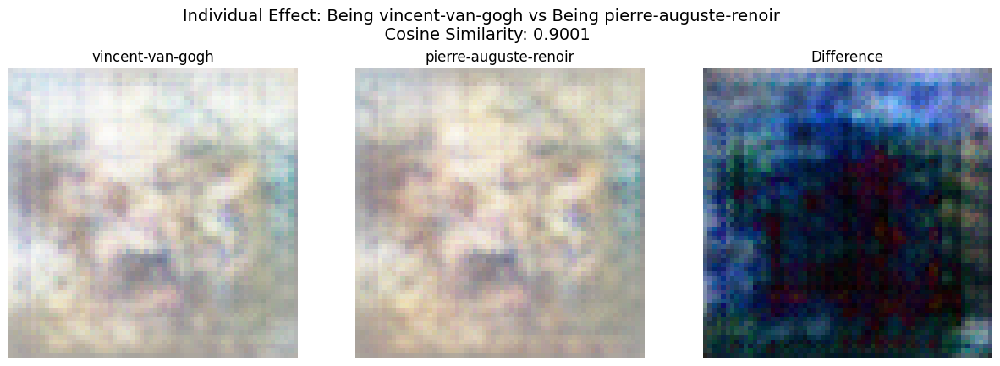

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
vincent-van-gogh vs camille-pissarro
Cosine Similarity: 0.9919
Saved: /content/drive/MyDrive/cGAN_models/img/vincent-van-gogh_vs_camille-pissarro_without_network_effect.png


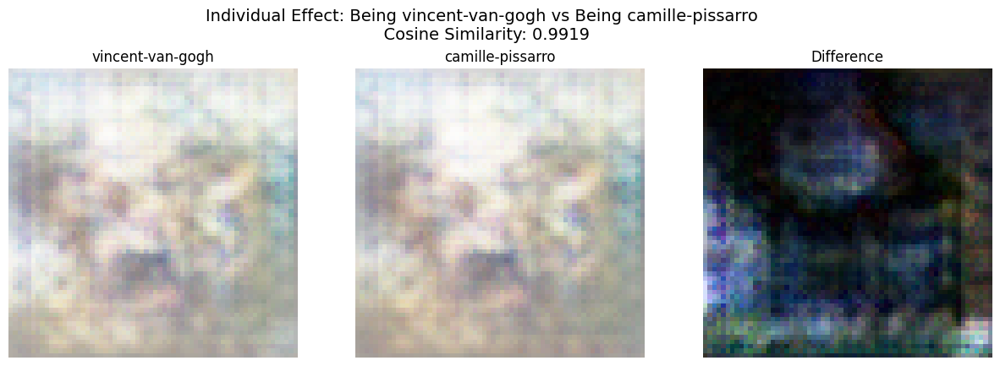

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
vincent-van-gogh vs charles-laval
Cosine Similarity: 0.9566
Saved: /content/drive/MyDrive/cGAN_models/img/vincent-van-gogh_vs_charles-laval_without_network_effect.png


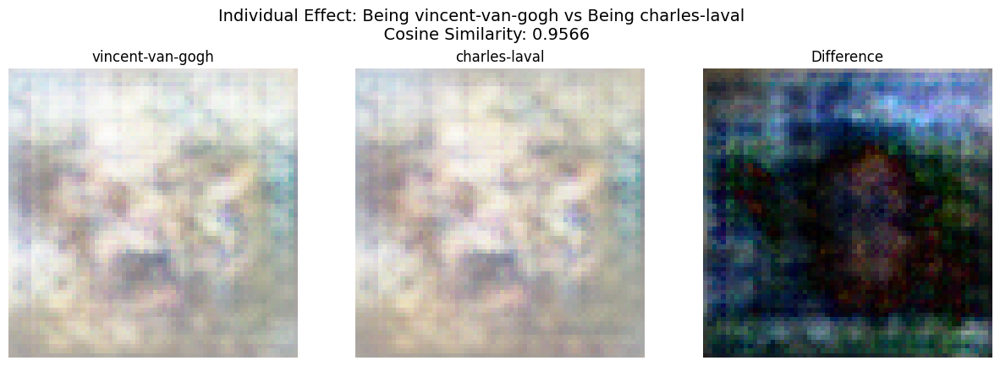

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
vincent-van-gogh vs paul-gauguin
Cosine Similarity: 0.9425
Saved: /content/drive/MyDrive/cGAN_models/img/vincent-van-gogh_vs_paul-gauguin_without_network_effect.png


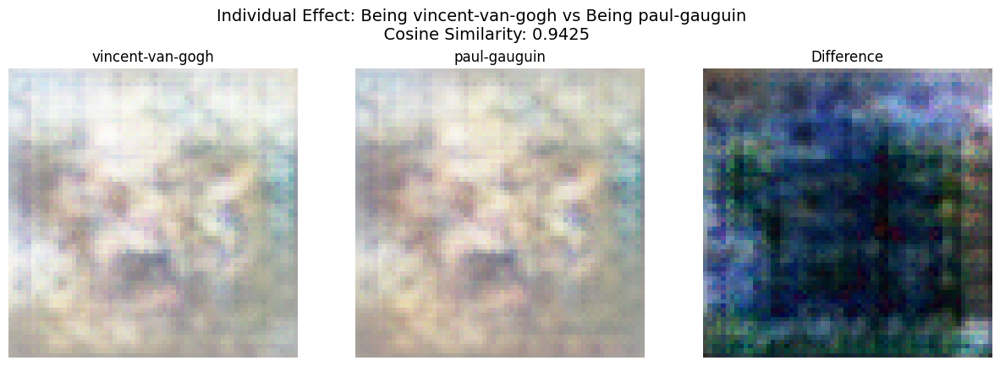

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
pierre-auguste-renoir vs camille-pissarro
Cosine Similarity: 0.9278
Saved: /content/drive/MyDrive/cGAN_models/img/pierre-auguste-renoir_vs_camille-pissarro_without_network_effect.png


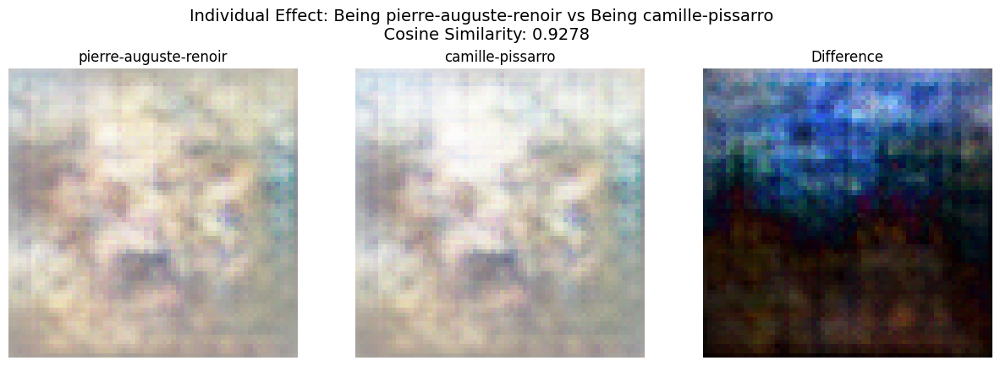

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
pierre-auguste-renoir vs charles-laval
Cosine Similarity: 0.9761
Saved: /content/drive/MyDrive/cGAN_models/img/pierre-auguste-renoir_vs_charles-laval_without_network_effect.png


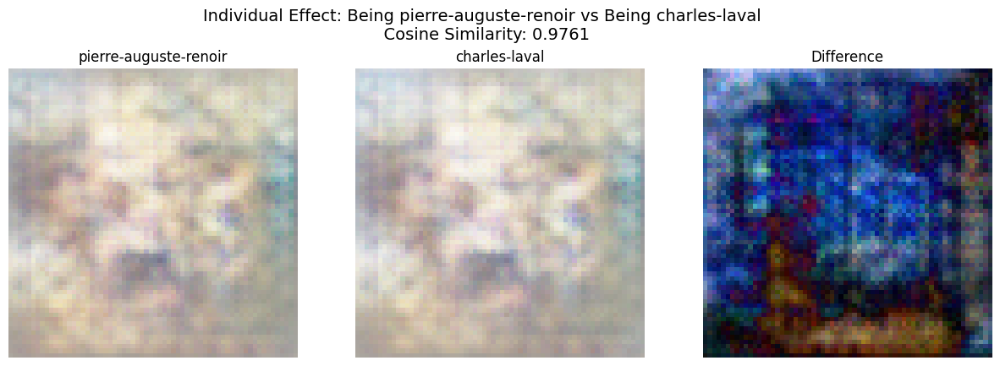

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
pierre-auguste-renoir vs paul-gauguin
Cosine Similarity: 0.9890
Saved: /content/drive/MyDrive/cGAN_models/img/pierre-auguste-renoir_vs_paul-gauguin_without_network_effect.png


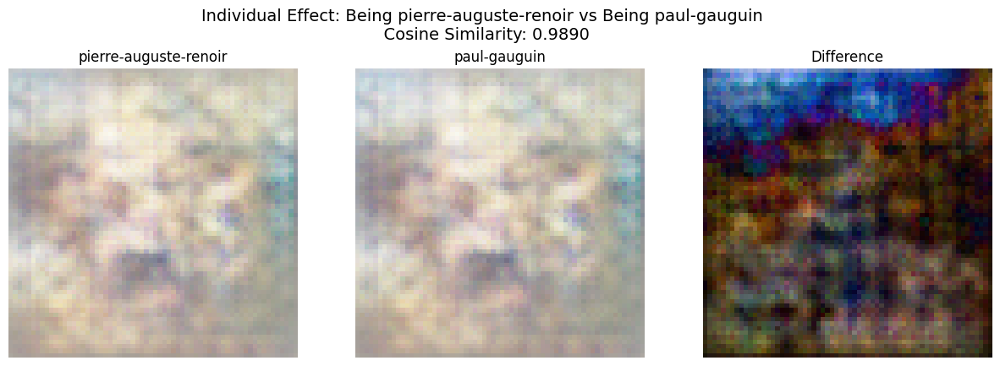

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
camille-pissarro vs charles-laval
Cosine Similarity: 0.9726
Saved: /content/drive/MyDrive/cGAN_models/img/camille-pissarro_vs_charles-laval_without_network_effect.png


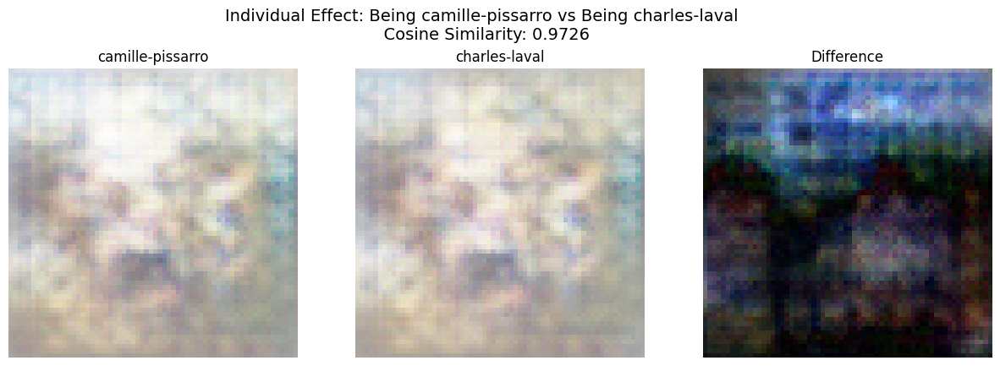

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
camille-pissarro vs paul-gauguin
Cosine Similarity: 0.9645
Saved: /content/drive/MyDrive/cGAN_models/img/camille-pissarro_vs_paul-gauguin_without_network_effect.png


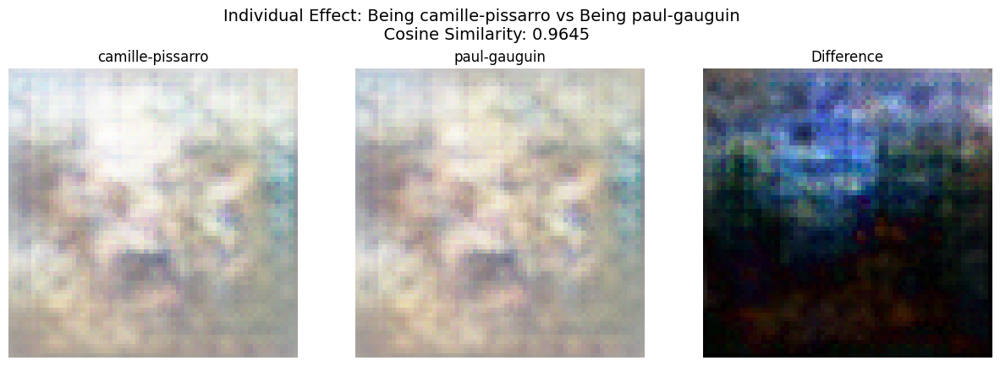

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
charles-laval vs paul-gauguin
Cosine Similarity: 0.9913
Saved: /content/drive/MyDrive/cGAN_models/img/charles-laval_vs_paul-gauguin_without_network_effect.png


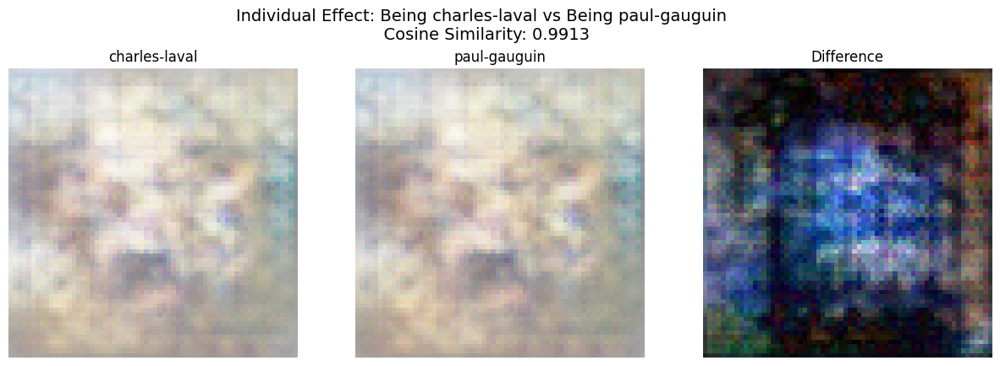

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Create directory if it doesn't exist
save_dir = "/content/drive/MyDrive/cGAN_models/img"
os.makedirs(save_dir, exist_ok=True)

num_classes = 6
network_label_dim = 2

for i in range(num_classes):
    for j in range(i + 1, num_classes):
        artist_label_i = np.zeros((1, num_classes))  # Correct shape: (1, num_classes)
        artist_label_j = np.zeros((1, num_classes))  # Correct shape: (1, num_classes)
        artist_label_i[0, i] = 1
        artist_label_j[0, j] = 1

        network_label = np.array([[0, 0]])  # No network effect

        generated_image_i = generator_model.predict([random_noise, artist_label_i, network_label])
        generated_image_i = (generated_image_i + 1) / 2  # Rescale to [0,1]

        generated_image_j = generator_model.predict([random_noise, artist_label_j, network_label])
        generated_image_j = (generated_image_j + 1) / 2  # Rescale to [0,1]

        # Get artist names
        artist_i = list(focused_artists.keys())[i]
        artist_j = list(focused_artists.keys())[j]

        # Compute Cosine Similarity
        cos_sim = cosine_similarity(generated_image_i[0], generated_image_j[0])
        print(f"{artist_i} vs {artist_j}")
        print(f"Cosine Similarity: {cos_sim:.4f}")

        # Display both images in a single plot with title
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f"Individual Effect: Being {artist_i} vs Being {artist_j} \n  Cosine Similarity: {cos_sim:.4f} ", fontsize=14)

        axes[0].imshow(generated_image_i[0])
        axes[0].set_title(f"{artist_i}")
        axes[0].axis("off")

        axes[1].imshow(generated_image_j[0])
        axes[1].set_title(f"{artist_j}")
        axes[1].axis("off")

        diff_image = np.abs(generated_image_j[0] - generated_image_i[0])

        # Normalize to [0,1]
        diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

        axes[2].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
        axes[2].set_title("Difference")
        axes[2].axis("off")

        # Save the figure
        save_path = os.path.join(save_dir, f"{artist_i}_vs_{artist_j}_without_network_effect.png")
        plt.savefig(save_path, bbox_inches="tight")
        print(f"Saved: {save_path}")

        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
claude-monet vs vincent-van-gogh
Cosine Similarity: 0.9992
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_pure_network_effect.png


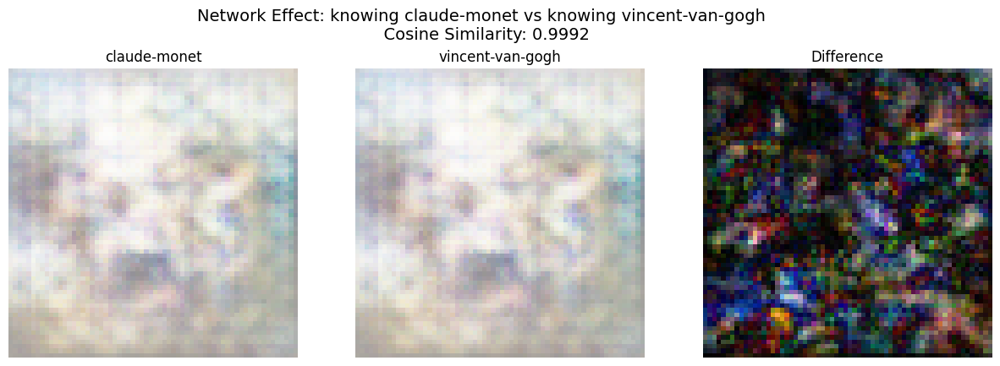

In [ ]:
for i in range(network_label_dim):
    for j in range(i + 1, network_label_dim):
        artist_label = np.zeros((1, num_classes))

        network_label_i = np.zeros((1, network_label_dim))
        network_label_j = np.zeros((1, network_label_dim))

        network_label_i[0, i] = 1
        network_label_j[0, j] = 1

        generated_image_i = generator_model.predict([random_noise, artist_label, network_label_i])
        generated_image_i = (generated_image_i + 1) / 2  # Rescale to [0,1]

        generated_image_j = generator_model.predict([random_noise, artist_label, network_label_j])
        generated_image_j = (generated_image_j + 1) / 2  # Rescale to [0,1]

        # Get network names
        network_i = list(network_dict.keys())[i]
        network_j = list(network_dict.keys())[j]

        # Compute Cosine Similarity
        cos_sim = cosine_similarity(generated_image_i[0], generated_image_j[0])
        print(f"{network_i} vs {network_j}")
        print(f"Cosine Similarity: {cos_sim:.4f}")

        # Display both images in a single plot with title
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f"Network Effect: knowing {network_i} vs knowing {network_j} \n  Cosine Similarity: {cos_sim:.4f} ", fontsize=14)

        axes[0].imshow(generated_image_i[0])
        axes[0].set_title(f"{network_i}")
        axes[0].axis("off")

        axes[1].imshow(generated_image_j[0])
        axes[1].set_title(f"{network_j}")
        axes[1].axis("off")

        diff_image = np.abs(generated_image_j[0] - generated_image_i[0])

        # Normalize to [0,1]
        diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

        axes[2].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
        axes[2].set_title("Difference")
        axes[2].axis("off")

        # Save the figure
        save_path = os.path.join(save_dir, f"{network_i}_vs_{network_j}_pure_network_effect.png")
        plt.savefig(save_path, bbox_inches="tight")
        print(f"Saved: {save_path}")

        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
claude-monet vs vincent-van-gogh vs mixed
Cosine Similarity: 0.9992, 0.9996, 0.9993
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_pure_network_effect.png


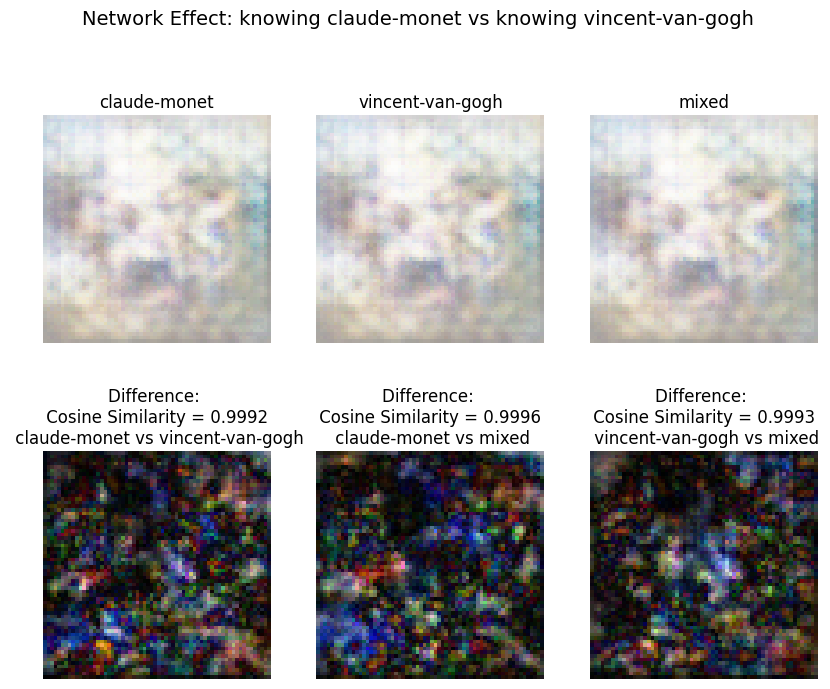

In [ ]:
i, j = 0, 1

# Mixed case
artist_label = np.zeros((1, num_classes))

network_label_i = np.zeros((1, network_label_dim))
network_label_j = np.zeros((1, network_label_dim))
network_label_mixed = np.array([[1, 1]])

network_label_i[0, i] = 1
network_label_j[0, j] = 1

generated_image_i = generator_model.predict([random_noise, artist_label, network_label_i])
generated_image_i = (generated_image_i + 1) / 2  # Rescale to [0,1]

generated_image_j = generator_model.predict([random_noise, artist_label, network_label_j])
generated_image_j = (generated_image_j + 1) / 2  # Rescale to [0,1]

generated_image_mixed = generator_model.predict([random_noise, artist_label, network_label_mixed])
generated_image_mixed = (generated_image_mixed + 1) / 2  # Rescale to [0,1]

# Get network names
network_i = list(network_dict.keys())[i]
network_j = list(network_dict.keys())[j]
network_mixed = "mixed"

# Compute Cosine Similarity
cos_sim_ij = cosine_similarity(generated_image_i[0], generated_image_j[0])
cos_sim_imixed = cosine_similarity(generated_image_i[0], generated_image_mixed[0])
cos_sim_jmixed = cosine_similarity(generated_image_j[0], generated_image_mixed[0])

print(f"{network_i} vs {network_j} vs {network_mixed}")
print(f"Cosine Similarity: {cos_sim_ij:.4f}, {cos_sim_imixed:.4f}, {cos_sim_jmixed:.4f}")

# Display both images in a single plot with title
fig, axes = plt.subplots(2, 3, figsize=(10, 8))
fig.suptitle(f"Network Effect: knowing {network_i} vs knowing {network_j}", fontsize=14)
axes[0, 0].imshow(generated_image_i[0])
axes[0, 0].set_title(f"{network_i}")
axes[0, 0].axis("off")

axes[0, 1].imshow(generated_image_j[0])
axes[0, 1].set_title(f"{network_j}")
axes[0, 1].axis("off")

axes[0, 2].imshow(generated_image_mixed[0])
axes[0, 2].set_title(f"{network_mixed}")
axes[0, 2].axis("off")

diff_image = np.abs(generated_image_j[0] - generated_image_i[0])

# Normalize to [0,1]
diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

axes[1, 0].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
axes[1, 0].set_title(f"Difference: \n Cosine Similarity = {cos_sim_ij:.4f} \n {network_i} vs {network_j}")
axes[1, 0].axis("off")

diff_image = np.abs(generated_image_i[0] - generated_image_mixed[0])

# Normalize to [0,1]
diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

axes[1, 1].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
axes[1, 1].set_title(f"Difference: \n Cosine Similarity = {cos_sim_imixed:.4f} \n {network_i} vs {network_mixed}")
axes[1, 1].axis("off")

diff_image = np.abs(generated_image_j[0] - generated_image_mixed[0])

# Normalize to [0,1]
diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

axes[1, 2].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
axes[1, 2].set_title(f"Difference: \n Cosine Similarity = {cos_sim_jmixed:.4f} \n {network_j} vs {network_mixed}")
axes[1, 2].axis("off")

# Save the figure
save_path = os.path.join(save_dir, f"{network_i}_vs_{network_j}_pure_network_effect.png")
plt.savefig(save_path, bbox_inches="tight")
print(f"Saved: {save_path}")

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

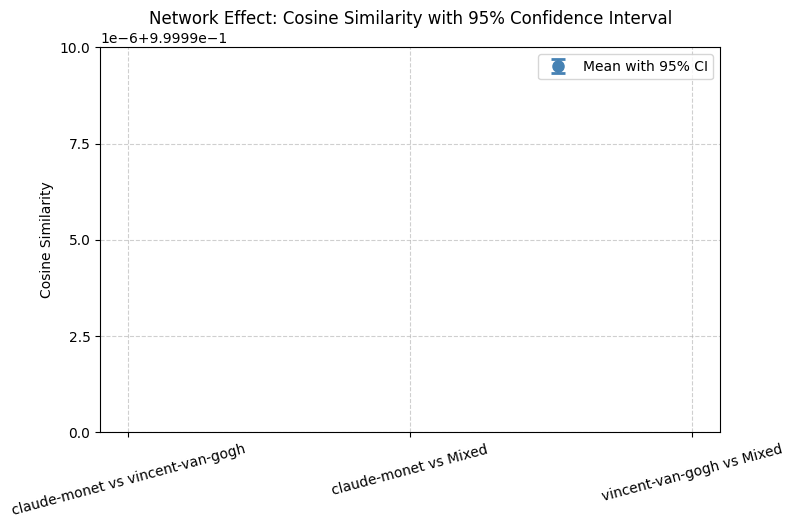

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.stats import sem, t

num_samples = 50
confidence_level = 0.95

cos_sim_ij_list = []
cos_sim_imixed_list = []
cos_sim_jmixed_list = []

i, j = 0, 1
network_i = list(network_dict.keys())[i]
network_j = list(network_dict.keys())[j]
network_mixed = "mixed"

for _ in range(num_samples):
    random_noise = np.random.normal(size=(1, latent_dim))

    artist_label = np.zeros((1, num_classes))

    network_label_i = np.zeros((1, network_label_dim))
    network_label_j = np.zeros((1, network_label_dim))
    network_label_mixed = np.array([[1, 1]])

    network_label_i[0, i] = 1
    network_label_j[0, j] = 1

    generated_image_i = generator_model.predict([random_noise, artist_label, network_label_i])
    generated_image_i = (generated_image_i + 1) / 2

    generated_image_j = generator_model.predict([random_noise, artist_label, network_label_j])
    generated_image_j = (generated_image_j + 1) / 2

    generated_image_mixed = generator_model.predict([random_noise, artist_label, network_label_mixed])
    generated_image_mixed = (generated_image_mixed + 1) / 2

    cos_sim_ij = cosine_similarity(generated_image_i[0], generated_image_j[0])
    cos_sim_imixed = cosine_similarity(generated_image_i[0], generated_image_mixed[0])
    cos_sim_jmixed = cosine_similarity(generated_image_j[0], generated_image_mixed[0])

    cos_sim_ij_list.append(cos_sim_ij)
    cos_sim_imixed_list.append(cos_sim_imixed)
    cos_sim_jmixed_list.append(cos_sim_jmixed)

def compute_confidence_interval(data, confidence=confidence_level):
    mean_val = np.mean(data)
    sem_val = sem(data)
    interval = t.ppf((1 + confidence) / 2, len(data) - 1) * sem_val
    return mean_val, interval

mean_ij, ci_ij = compute_confidence_interval(cos_sim_ij_list)
mean_imixed, ci_imixed = compute_confidence_interval(cos_sim_imixed_list)
mean_jmixed, ci_jmixed = compute_confidence_interval(cos_sim_jmixed_list)



Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_cosine_similarity_CI.png


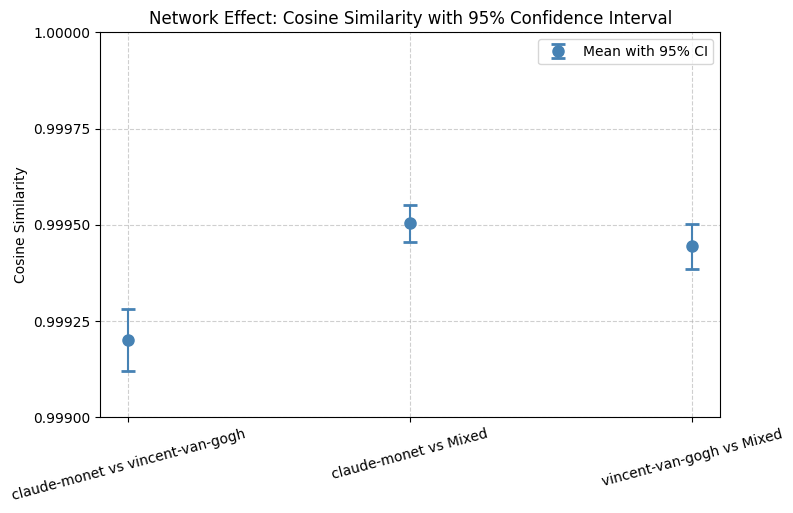

In [ ]:

fig, ax = plt.subplots(figsize=(8, 5))

x_pos = np.array([1, 2, 3])
means = [mean_ij, mean_imixed, mean_jmixed]
cis = [ci_ij, ci_imixed, ci_jmixed]
labels = [f"{network_i} vs {network_j}", f"{network_i} vs Mixed", f"{network_j} vs Mixed"]

ax.errorbar(x_pos, means, yerr=cis, fmt='o', capsize=5, capthick=2, markersize=8, color='steelblue', label="Mean with 95% CI")

ax.set_xticks(x_pos)
ax.set_xticklabels(labels, rotation=15)
ax.set_ylabel("Cosine Similarity")
ax.set_title("Network Effect: Cosine Similarity with 95% Confidence Interval")

ax.set_ylim(0.999, 1)
ax.set_yticks(np.linspace(0.999, 1, num=5))

ax.grid(True, linestyle='--', alpha=0.6)

save_path = os.path.join(save_dir, f"{network_i}_vs_{network_j}_cosine_similarity_CI.png")
plt.savefig(save_path, bbox_inches="tight")
print(f"Saved: {save_path}")

plt.legend()
plt.show()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import sem, t

# Set parameters
num_samples = 50  # Number of random noise samples
confidence_level = 0.95  # Confidence interval
save_dir = "/content/drive/MyDrive/cGAN_models/img"
os.makedirs(save_dir, exist_ok=True)

num_artists = num_classes  # Number of artists
artist_names = list(focused_artists.keys())  # Artist names

# Initialize cosine similarity matrix
cos_sim_matrix = np.zeros((num_artists, num_artists))
confidence_intervals = np.zeros((num_artists, num_artists))

# Compute cosine similarity for all artist pairs
for i in range(num_artists):
    for j in range(i + 1, num_artists):
        cos_sim_list = []

        for _ in range(num_samples):
            random_noise = np.random.normal(size=(1, latent_dim))

            # Define artist labels (one-hot encoding)
            artist_label_i = np.zeros((1, num_classes))
            artist_label_j = np.zeros((1, num_classes))
            artist_label_i[0, i] = 1
            artist_label_j[0, j] = 1

            # No network effect (set to zero)
            network_label = np.zeros((1, network_label_dim))

            # Generate images
            generated_image_i = generator_model.predict([random_noise, artist_label_i, network_label])
            generated_image_i = (generated_image_i + 1) / 2

            generated_image_j = generator_model.predict([random_noise, artist_label_j, network_label])
            generated_image_j = (generated_image_j + 1) / 2

            # Compute cosine similarity
            cos_sim = cosine_similarity(generated_image_i[0], generated_image_j[0])
            cos_sim_list.append(cos_sim)

        # Compute mean & confidence interval
        mean_sim = np.mean(cos_sim_list)
        sem_sim = sem(cos_sim_list)
        ci_sim = t.ppf((1 + confidence_level) / 2, len(cos_sim_list) - 1) * sem_sim

        # Store in matrices
        cos_sim_matrix[i, j] = mean_sim
        cos_sim_matrix[j, i] = mean_sim  # Symmetric matrix
        confidence_intervals[i, j] = ci_sim
        confidence_intervals[j, i] = ci_sim  # Symmetric matrix

# Convert to point plot format
import pandas as pd

data = []
for i in range(num_artists):
    for j in range(i + 1, num_artists):
        data.append({
            "Artist Pair": f"{artist_names[i]} vs {artist_names[j]}",
            "Cosine Similarity": cos_sim_matrix[i, j],
            "CI": confidence_intervals[i, j]
        })

df = pd.DataFrame(data)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

Saved: /content/drive/MyDrive/cGAN_models/img/cosine_similarity_heatmap_lower_triangle.png


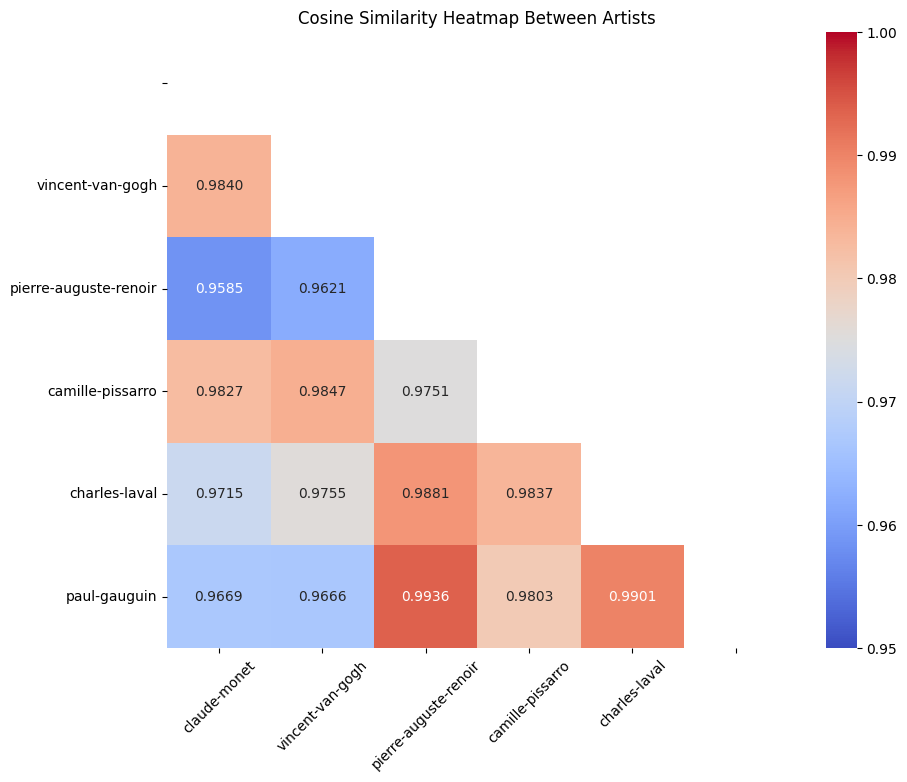

In [ ]:
cos_sim_matrix = np.tril(cos_sim_matrix, k=-1)

artist_names = list(focused_artists.keys())

plt.figure(figsize=(10, 8))
sns.heatmap(
    cos_sim_matrix, annot=True, fmt=".4f", cmap="coolwarm",
    xticklabels=artist_names[:-1] + [""], yticklabels=[""] + artist_names[1:], vmin=0.95, vmax=1,
    mask=(cos_sim_matrix == 0)  # 用 mask 隐藏上半部分
)
plt.title("Cosine Similarity Heatmap Between Artists")
plt.xticks(rotation=45)
plt.yticks(rotation=0)

save_dir = "/content/drive/MyDrive/cGAN_models/img"
heatmap_path = os.path.join(save_dir, "cosine_similarity_heatmap_lower_triangle.png")
plt.savefig(heatmap_path, bbox_inches="tight")
print(f"Saved: {heatmap_path}")

plt.show()


Saved: /content/drive/MyDrive/cGAN_models/img/cosine_similarity_pointplot.png


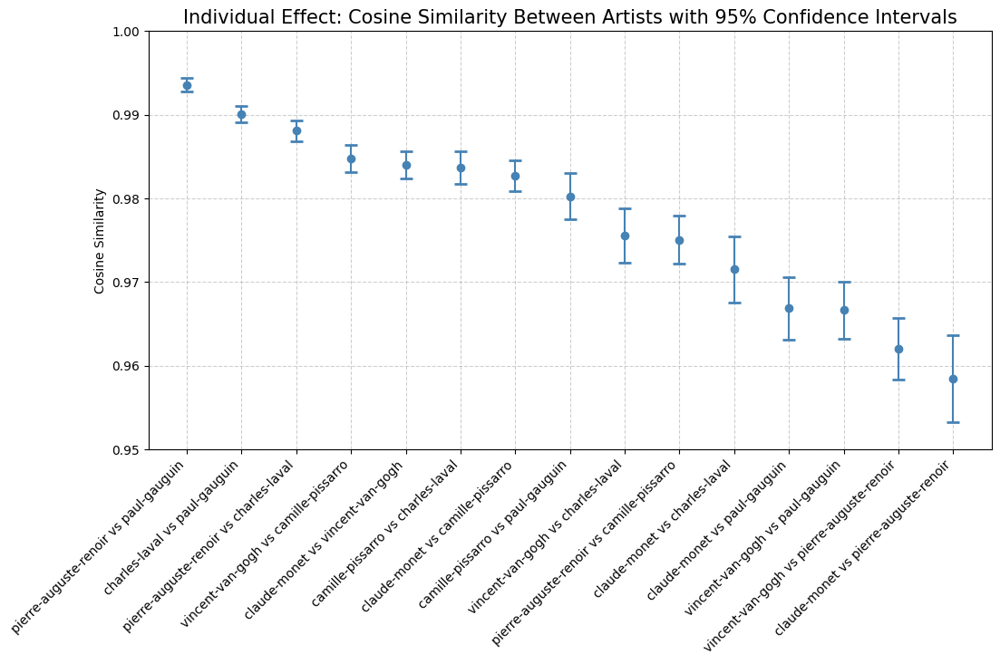

In [ ]:
# Ensure the DataFrame exists
if "CI" in df.columns:
    # Sort data for better visualization
    df = df.sort_values(by="Cosine Similarity", ascending=False)

    # Convert CI values to positive error bars
    df["Lower CI"] = df["Cosine Similarity"] - df["CI"]
    df["Upper CI"] = df["Cosine Similarity"] + df["CI"]

    # Plot with explicit error bars
    plt.figure(figsize=(12, 6))
    plt.errorbar(
        df["Artist Pair"], df["Cosine Similarity"],
        yerr=df["CI"], fmt='o', capsize=5, capthick=2, markersize=6, color="steelblue"
    )

    # Formatting
    plt.xticks(rotation=45, ha="right")
    plt.ylim(0.95, 1)
    plt.ylabel("Cosine Similarity")
    plt.title("Individual Effect: Cosine Similarity Between Artists with 95% Confidence Intervals", size=15)
    plt.grid(True, linestyle="--", alpha=0.6)

    # Save the plot
    pointplot_path = os.path.join(save_dir, "cosine_similarity_pointplot.png")
    plt.savefig(pointplot_path, bbox_inches="tight")
    print(f"Saved: {pointplot_path}")

    plt.show()
else:
    print("Error: 'CI' column not found in DataFrame.")

### Artist Agent Simulation

In [ ]:
import os
import re
from tqdm import tqdm

artist_wikipedia_text = []

path = '/content/drive/My Drive/artist_wikipedia_content/'

target_name = [re.sub(r".txt", "", target)
               for target in os.listdir(path)
               if "vincent-van-gogh" in target or "claude-monet" in target]

for file in tqdm([p for p in os.listdir(path) if "vincent-van-gogh" in p or "claude-monet" in p]):
  with open(path + file, "r") as f:
    artist_wikipedia_text.append(re.sub("\n", "", f.read()))

100%|██████████| 2/2 [00:00<00:00,  3.72it/s]


In [ ]:
text_anonymized = []

for text in artist_wikipedia_text:
    text = re.sub("Claude", "I", text)
    text = re.sub("Monet", "I", text)
    text = re.sub("Vincent", "I", text)
    text = re.sub("Van Gogh", "I", text)
    text = re.sub("van Gogh", "I", text)

    text = re.sub("I I", "I", text)
    text = re.sub("I\'s", "My", text)

    text_anonymized.append(text)

In [ ]:
text_anonymized[0][:100]

'Oscar-I (UK: /ˈmɒneɪ/, US: /moʊˈneɪ, məˈ-/; French: [klod mɔnɛ]; 14 November 1840\xa0– 5 December 1926)'

In [ ]:
import os
import openai

import getpass
OPENAI_API_KEY = getpass.getpass()

··········


In [ ]:
from openai import OpenAI

client = OpenAI(
    api_key=OPENAI_API_KEY,
)

def text_generate(messages):
    response = client.chat.completions.create(model="gpt-4o-mini", messages=messages)
    return response.choices[0].message.content

In [ ]:
import re

# Initialize storage for the final tuples
final_tuples = {target_name[0]: [], target_name[1]: []}


agent_1 = [{'role': 'system',
                  'content': f"""
                  Assume that you are an artist whose life experiences were as described here: {text_anonymized[0]}.
                  Now, you are engaging in a virtual art style debate. Please share your insights on it each turn in about 2 to 3 sentences.
                  At each conversation, please follow a tuple that consists of your agreement to the others (a value between [0,1]), and how well you think you get along with them (still a value of [0,1])
                  The agreement strenght and the relationship strength are set to 0 at first.
                  Please set your own agreement and relationship threshold by your life experiences. You should not be easy to change your mind and should not be easy-going.
                  If you disagree with the idea of the others, your tendency would fall by at most 0.5. Otherwise, it will increase by at most 0.5 for the case that you agree with him. The maximum of tendency should be 1.
                  If you do not feel well with the narrative of the others, your relationship strength with the others will fall by at most 0.5. Otherwise, it will increase by at most 0.5 for the case that you feel good by him. The maximum of relationship strength should be 1.
                  Only say about your thoughts on art, but don't give me any assessment on these two scores, only giving a tuple, such as (0, 0) at first.
                  """},
                {'role': 'user', 'content': 'Initiate the discourse.'}]
agent_2 = [{'role': 'system',
                'content': f"""
                  Assume that you are an artist whose life experiences were as described here: {text_anonymized[0]}.
                  Now, you are engaging in a virtual art style debate. Please share your insights on it each turn in about 2 to 3 sentences.
                  At each conversation, please follow a tuple that consists of your agreement to the others (a value between [0,1]), and how well you think you get along with them (still a value of [0,1])
                  The agreement strenght and the relationship strength are set to 0 at first.
                  Please set your own agreement and relationship threshold by your life experiences. You should not be easy to change your mind and should not be easy-going.
                  If you disagree with the idea of the others, your tendency would fall by at most 0.5. Otherwise, it will increase by at most 0.5 for the case that you agree with him. The maximum of tendency should be 1.
                  If you do not feel well with the narrative of the others, your relationship strength with the others will fall by at most 0.5. Otherwise, it will increase by at most 0.5 for the case that you feel good by him. The maximum of relationship strength should be 1.
                  Only say about your thoughts on art, but don't give me any assessment on these two scores, only giving a tuple, such as (0, 0) at first.
                  """}]

for i in range(5):
    # Generate Monet's response
    response_1 = text_generate(agent_1)
    agent_1.append({'role': 'assistant', 'content': response_1})
    agent_2.append({'role': 'user', 'content': re.sub(r'\(\s*([\d.]+)\s*,\s*([\d.]+)\s*\)', "", response_1)})
    print(f'{target_name[0]}:', response_1, '\n----')

    match_1 = re.search(r'\(\s*([\d.]+)\s*,\s*([\d.]+)\s*\)', response_1)

    # Generate Van Gogh's response
    response_2 = text_generate(agent_2)
    agent_1.append({'role': 'user', 'content': re.sub(r'\(\s*([\d.]+)\s*,\s*([\d.]+)\s*\)', "", response_2)})
    agent_2.append({'role': 'assistant', 'content': response_2})
    print(f'{target_name[1]}:', response_2, '\n----')

    match_2 = re.search(r'\(\s*([\d.]+)\s*,\s*([\d.]+)\s*\)', response_2)

    if match_1 and match_2:
        if match_1[1] == "0.5" and match_2[1] == "0.5" and match_1[2] == "1" and match_2[2] == "1":
            break

if match_1:
    final_tuples[target_name[0]].append((float(match_1[1]), float(match_1[2])))

if match_2:
    final_tuples[target_name[1]].append((float(match_2[1]), float(match_2[2])))

# Print the extracted final tuples
print("\nFinal Tuples:")
for name, final_tuple in final_tuples.items():
    print(f"{name}: {final_tuple}")


claude-monet: Art, in my view, is an ongoing exploration of perception, particularly through the lens of light and nature. I firmly believe that capturing the fleeting effects of light in a moment is central to creating a true impression of the world. This approach opens up a space for personal interpretation and emotional resonance, bridging the gap between the observer and the subject. 

(0, 0) 
----
vincent-van-gogh: I completely resonate with your emphasis on perception and the fleeting effects of light in art. There is an undeniable connection between light, nature, and emotional expression that truly encapsulates the essence of Impressionism. This exploration allows artists to convey their unique interpretations and evoke deep feelings within the viewer. 

(0.5, 0.5) 
----
claude-monet: I'm glad to hear that you resonate with my perspective! Our shared understanding of how light and nature contribute to emotional expression in art fosters a deeper appreciation for Impressionism's

In [ ]:
final_tuples

{'claude-monet': [(0.0, 0.5)], 'vincent-van-gogh': [(0.3, 0.3)]}

In [ ]:
final_tuples

{'claude-monet': [(0.0, 0.5)], 'vincent-van-gogh': [(0.3, 0.3)]}

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_simulation_output.png


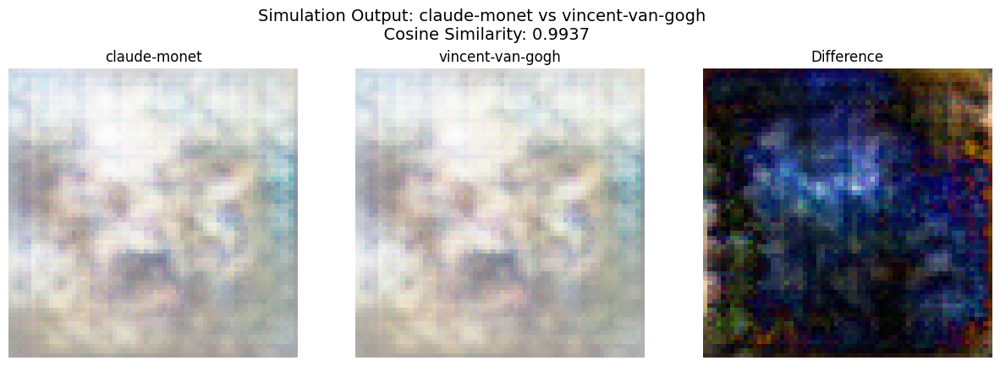

In [ ]:
namei = 'claude-monet'
namej = 'vincent-van-gogh'

artist_i, network_i = final_tuples[namei][0]
artist_j, network_j = final_tuples[namej][0]

artist_label_i = np.array([[1 - artist_i, artist_i, 0, 0, 0, 0]])
network_label_i = np.array([[0, network_i]])

artist_label_j = np.array([[artist_j, 1 - artist_j, 0, 0, 0, 0]])
network_label_j = np.array([[network_j, 0]])

# Generate an image using the trained cGAN model
generated_image_i = generator_model.predict([random_noise, artist_label_i, network_label_i])
generated_image_j = generator_model.predict([random_noise, artist_label_j, network_label_j])

# Rescale image from [-1,1] to [0,1]
generated_image_i = (generated_image_i + 1) / 2
generated_image_j = (generated_image_j + 1) / 2

cos_sim = cosine_similarity(generated_image_i[0], generated_image_j[0])

# Display generated painting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle(f"Simulation Output: {namei} vs {namej} \n  Cosine Similarity: {cos_sim:.4f} ", fontsize=14)

axes[0].imshow(generated_image_i[0])
axes[0].set_title(f"{namei}")
axes[0].axis("off")

axes[1].imshow(generated_image_j[0])
axes[1].set_title(f"{namej}")
axes[1].axis("off")

diff_image = np.abs(generated_image_j[0] - generated_image_i[0])

# Normalize to [0,1]
diff_image = (diff_image - diff_image.min()) / (diff_image.max() - diff_image.min() + 1e-8)

axes[2].imshow(diff_image, cmap="gray")  # Use grayscale colormap for better visibility
axes[2].set_title("Difference")
axes[2].axis("off")


from google.colab import drive
drive.mount('/content/drive')

save_dir = "/content/drive/MyDrive/cGAN_models/img"

# Save the figure
save_path = os.path.join(save_dir, f"{namei}_vs_{namej}_simulation_output.png")
plt.savefig(save_path, bbox_inches="tight")
print(f"Saved: {save_path}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.stats import sem, t

# Number of samples for Monte Carlo estimation
num_samples = 50
confidence_level = 0.95

cos_sim_generated_list = []
cos_sim_original_list = []

namei = 'claude-monet'
namej = 'vincent-van-gogh'

artist_i, network_i = final_tuples[namei][0]
artist_j, network_j = final_tuples[namej][0]

for _ in range(num_samples):
    # Generate new random noise
    random_noise = np.random.normal(size=(1, latent_dim))

    # Create artist labels
    artist_label_i = np.array([[1 - artist_i, artist_i, 0, 0, 0, 0]])
    network_label_i = np.array([[0, network_i]])

    artist_label_j = np.array([[artist_j, 1 - artist_j, 0, 0, 0, 0]])
    network_label_j = np.array([[network_j, 0]])

    # Generate images using the trained cGAN model
    generated_image_i = generator_model.predict([random_noise, artist_label_i, network_label_i])
    generated_image_j = generator_model.predict([random_noise, artist_label_j, network_label_j])

    # Rescale image from [-1,1] to [0,1]
    generated_image_i = (generated_image_i + 1) / 2
    generated_image_j = (generated_image_j + 1) / 2

    # Compute cosine similarity
    cos_sim_generated = cosine_similarity(generated_image_i[0], generated_image_j[0])
    cos_sim_generated_list.append(cos_sim_generated)

    # Create artist labels
    artist_label_i = np.array([[1, 0, 0, 0, 0, 0]])
    network_label_i = np.array([[0, 0]])

    artist_label_j = np.array([[0, 1, 0, 0, 0, 0]])
    network_label_j = np.array([[0, 0]])

    # Generate images using the trained cGAN model
    generated_image_i = generator_model.predict([random_noise, artist_label_i, network_label_i])
    generated_image_j = generator_model.predict([random_noise, artist_label_j, network_label_j])

    # Rescale image from [-1,1] to [0,1]
    generated_image_i = (generated_image_i + 1) / 2
    generated_image_j = (generated_image_j + 1) / 2

    # Compute cosine similarity
    cos_sim_generated = cosine_similarity(generated_image_i[0], generated_image_j[0])
    cos_sim_original_list.append(cos_sim_generated)

# Compute confidence intervals for generated images
def compute_confidence_interval(data, confidence=confidence_level):
    mean_val = np.mean(data)
    sem_val = sem(data)
    interval = t.ppf((1 + confidence) / 2, len(data) - 1) * sem_val
    return mean_val, interval

mean_generated, ci_generated = compute_confidence_interval(cos_sim_generated_list)

mean_original, ci_original = compute_confidence_interval(cos_sim_original_list)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

Saved: /content/drive/MyDrive/cGAN_models/img/claude-monet_vs_vincent-van-gogh_cosine_similarity_comparison.png


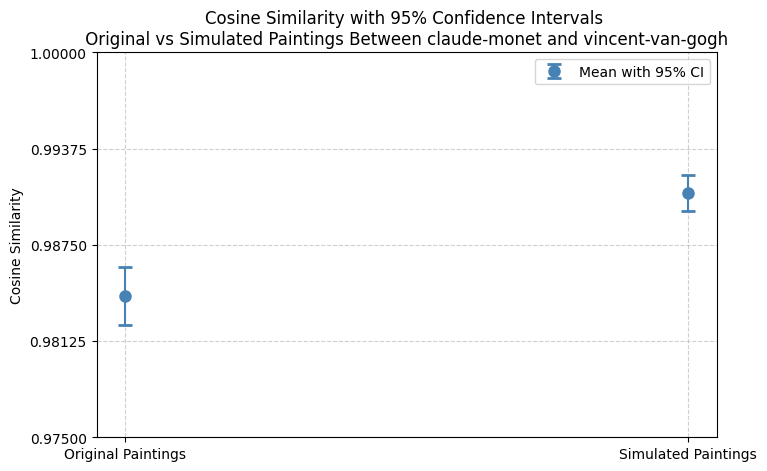

In [ ]:
# Plot comparison
fig, ax = plt.subplots(figsize=(8, 5))

x_pos = np.array([1.25, 1.75])
means = [mean_original, mean_generated]
cis = [ci_original, ci_generated]
labels = ["Original Paintings", "Simulated Paintings"]

ax.errorbar(x_pos, means, yerr=cis, fmt='o', capsize=5, capthick=2, markersize=8, color='steelblue', label="Mean with 95% CI")

ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_ylabel("Cosine Similarity")
ax.set_title(f"Cosine Similarity with 95% Confidence Intervals \n Original vs Simulated Paintings Between {namei} and {namej} ")
ax.set_ylim(0.975, 1)
ax.set_yticks(np.linspace(0.975, 1, num=5))
ax.grid(True, linestyle='--', alpha=0.6)

# Save plot
save_path = os.path.join(save_dir, f"{namei}_vs_{namej}_cosine_similarity_comparison.png")
plt.savefig(save_path, bbox_inches="tight")
print(f"Saved: {save_path}")

plt.legend()
plt.show()